<a href="https://colab.research.google.com/github/FKz11/Portfolio_Data_Science_2.0/blob/main/Image_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Segmentation

## Задача сегментации изображения

### Задача: 

Обучить модель выделять 6 классов на изображении. 1-ый класс отвечает за фон. 6-ой класс отвечает за силуэт птицы. Классы со 2 по 5 отвечают за границы между силуэтом птицы и фоном.

### Загрузка библиотек

In [ ]:
!pip install -q tfds-nightly

     |████████████████████████████████| 4.3 MB 12.7 MB/s 
     |████████████████████████████████| 86 kB 4.0 MB/s 


In [ ]:
!pip install -q git+https://github.com/tensorflow/examples.git

    Running setup.py install for tensorflow-examples ... done
  DEPRECATION: tensorflow-examples was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [ ]:
import tensorflow_datasets as tfds
import tensorflow as tf
from tensorflow_examples.models.pix2pix import pix2pix
from keras import backend as K

import numpy as np
import matplotlib.pyplot as plt

### Загрузка датасета caltech_birds2011

In [ ]:
dataset_all, info = tfds.load('caltech_birds2011', with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/5994 [00:00<?, ? examples/s]

Shuffling ~/tensorflow_datasets/caltech_birds2011/0.1.1.incomplete591NHD/caltech_birds2011-train.tfrecord*...:…

Generating test examples...:   0%|          | 0/5794 [00:00<?, ? examples/s]

Shuffling ~/tensorflow_datasets/caltech_birds2011/0.1.1.incomplete591NHD/caltech_birds2011-test.tfrecord*...: …

Dataset caltech_birds2011 downloaded and prepared to ~/tensorflow_datasets/caltech_birds2011/0.1.1. Subsequent calls will reuse this data.


In [ ]:
np.unique(list(dataset_all['train'].take(1).as_numpy_iterator())[0]['segmentation_mask'])

array([  0,  51, 102, 153, 204, 255], dtype=uint8)

Изначально у нас каждая картинка размечена 6 классами.

In [ ]:
OUTPUT_CHANNELS = 6

In [ ]:
list(dataset_all['train'].take(1).as_numpy_iterator())[0]['image'].shape

(333, 500, 3)

In [ ]:

list(dataset_all['train'].take(2).as_numpy_iterator())[1]['image'].shape

(290, 500, 3)

Изначально у нас изображения разных размеров формата rgb

Приведём изображения к размеру 128*128 и значения элементов тензоров от 0 до 1, так как такие значения более удобные для нейронной сети.

In [ ]:
@tf.function
def load_image(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_image = tf.cast(input_image, tf.float32) / 255.0

  new_mask = []
  for i in [  0, 51, 102, 153, 204, 255]:
    new_mask.append(tf.cast((datapoint['segmentation_mask'] == i), tf.float32)[:,:,0])
  new_mask = tf.stack(new_mask, axis=2)

  input_mask = tf.image.resize(new_mask, (128, 128)) # (128,128,6)

  # input_mask = tf.where((input_mask == 0.0) | (input_mask == 5.0), input_mask, 1.0) # (128,128,3)

  return input_image, input_mask

In [ ]:
train = dataset_all['train'].map(load_image)
test = dataset_all['test'].map(load_image)

In [ ]:
TRAIN_LENGTH = info.splits['train'].num_examples
BATCH_SIZE = 16
BUFFER_SIZE = 128
STEPS_PER_EPOCH = TRAIN_LENGTH // 10 // BATCH_SIZE

In [ ]:
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)

Отобразим наши изображения и их маски

In [ ]:
def display(display_list, full=False, highlight=False):
  color_list = [[0, 0, 0], [0, 0, 1], [0, 1, 0], [1, 1, 0], 
                [0, 1, 1], [1, 0, 1], [1, 0, 0]]
  n = len(display_list)
  m = 1
  title = ['Input Image', 'True Mask']
  if n > 2:
    title.append('Predicted Mask')
  if full:
    m += 1 + n
    title.extend([f'True_layer_{i+1}' for i in range(6)])
    if n > 2:
      title.extend([f'Predicted_layer_{i+1}' for i in range(6)])

  if full:
    plt.figure(figsize=(5*m, 5*n))
  else:
    plt.figure(figsize=(5*n, 5*m))

  for i in range(m * n):
    if full:
      plt.subplot(n, m, m*(i%n)+i//n+1)
    else:
      plt.subplot(m, n, i+1)
    plt.title(title[i])
    if i == 0:
      image = display_list[0]
      plt.imshow(tf.keras.preprocessing.image.array_to_img(image))
    if (i > 0) and (i < n):
      image = tf.expand_dims( tf.argmax(display_list[i], axis=2), axis=2)
      plt.imshow(tf.keras.preprocessing.image.array_to_img(image), cmap='Dark2', interpolation='none')
    if i >= n:
      if highlight:
        image = tf.expand_dims( tf.cast( tf.argmax(display_list[i//(8+int(full))+1], axis=2) == i-n*((i//(8+int(full)))*2 + 1), tf.int32) , axis=2)
      else:
        image = tf.expand_dims( display_list[i//(8+int(full))+1][:,:,i-n*((i//(8+int(full)))*2 + 1)], axis=2)
      plt.imshow(tf.keras.preprocessing.image.array_to_img(image), interpolation='none')
    plt.axis('off')
  plt.show()

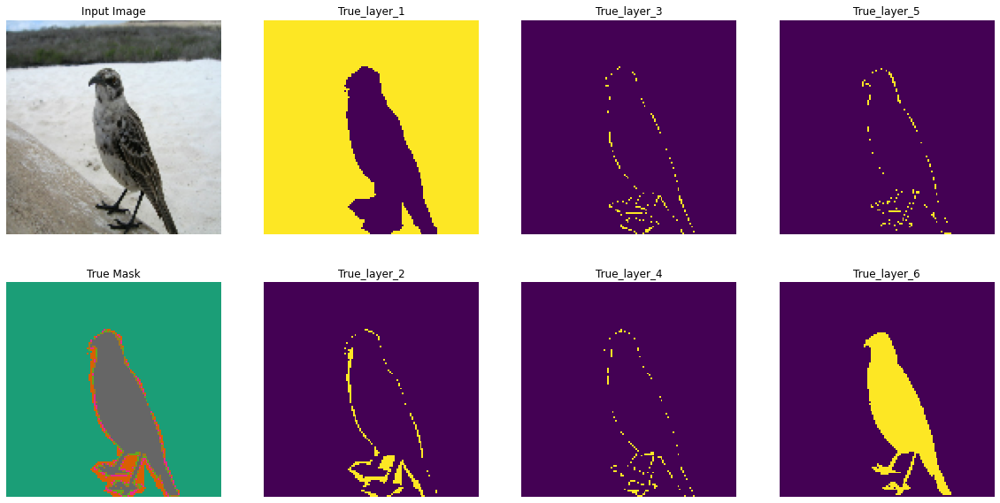

In [ ]:
for image, mask in test_dataset.take(1):
  sample_image, sample_mask = image, mask
display([sample_image[1,:,:,:], sample_mask[1,:,:,:]], full=True, highlight=True)

### Определение модели

В качестве модели возьмём U-Net. В качестве энкодера будет использоваться предтренированный MobileNetV2. Декодером же будет апсемпл блок уже имплементированный в TensorFlow examples Pix2pix.

In [ ]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

9420800/9406464 [==============================] - 0s 0us/step


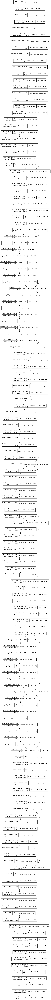

In [ ]:
tf.keras.utils.plot_model(base_model, show_shapes=True)

In [ ]:
def unet_model(channels=6, down_stack_trainable=False, deep=5):

  # Use the activations of these layers
  layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
  ]
  layer_names = layer_names[:deep]
  layers = [base_model.get_layer(name).output for name in layer_names]

  # Create the feature extraction model
  down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers, name='hidden_layer')

  if not down_stack_trainable:
    down_stack.trainable = False
  
  up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
  ]
  up_stack = up_stack[len(up_stack)-deep+1:]
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  if deep == 1:
    x = skips
    skips = []
  else:
    x = skips[-1]
    skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      channels, 3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)
  x = tf.keras.activations.sigmoid(x)
  return tf.keras.Model(inputs=inputs, outputs=x)

### Определим метрику

Определим метрику по которой будем оценивать успешность решения моделью нашей задачи: предсказать каждый класс на изображении. Для этого нам нужно, чтобы модель умела предсказывать каждый класс, а не только те, которые ей проще всего. Поэтому нам нужна взвешенная оценка по классам.

In [ ]:
def score(y_true, y_pred):
  weights = K.sum(K.sum(y_true, 1), 1)
  weights = (K.sum(weights, 1, keepdims=True) + 1) / (weights + 1)
  loss = y_true * y_true - (y_true * y_pred  / (K.sum(y_pred, -1, keepdims=True)))
  loss *= K.map_fn(lambda x: x[tf.newaxis, tf.newaxis, ...], weights)
  loss = K.sum(loss)
  loss /= K.sum(y_true * y_true * K.map_fn(lambda x: x[tf.newaxis, tf.newaxis, ...], weights))
  score = 1-loss
  return score

### Определим функцию потерь

In [ ]:
def weighted_categorical_crossentropy(start_weights=False, auto_weights=False):

    if start_weights:
      start_weights = K.variable(start_weights)
    else:
      start_weights = 1

    def loss(y_true, y_pred):
        loss = y_true * y_true - y_true * y_pred  / (K.sum(y_pred, -1, keepdims=True))
        loss *= start_weights
        loss = K.sum(loss)
        return loss

    def auto_loss(y_true, y_pred):
        weights = K.sum(K.sum(y_true, 1), 1)
        weights = (K.sum(weights, 1, keepdims=True) + 1) / (weights + 1)
        loss = y_true * y_true - (y_true * y_pred  / (K.sum(y_pred, -1, keepdims=True)))
        loss *= K.map_fn(lambda x: x[tf.newaxis, tf.newaxis, ...], weights)
        loss = K.sum(loss)
        return loss

    if auto_weights:
      return auto_loss
    return loss

Определяем модель, оптимизатор, функцию потерь, метрику их гиперпараметры и обучаем

In [ ]:
def nn(train_dataset, test_dataset, sample_image, sample_mask, num_test_examp, 
       steps_per_epoch, channels=6, batch=16, down_stack_trainable=False, deep=5, 
        start_weights=False, auto_weights=False, epochs=10, full=True, highlight=True,
          num_image=3, callbacks=[], hidden_layer=False):
  model = unet_model(channels, down_stack_trainable, deep)
  model.compile(optimizer='adam',
              loss=weighted_categorical_crossentropy(start_weights, auto_weights),
              metrics=[score])

  VAL_SUBSPLITS = 5
  VALIDATION_STEPS = num_test_examp//10//batch//VAL_SUBSPLITS

  model_history = model.fit(train_dataset, epochs=epochs,
                          steps_per_epoch=steps_per_epoch,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_dataset,
                          callbacks=callbacks)
  
  for i in range(num_image):
    display([sample_image[4+i,:,:,:], sample_mask[4+i,:,:,:], model.predict(sample_image)[4+i,:,:,:]], full, highlight)
  if hidden_layer:
    if deep==1:
      display([sample_image[6,:,:,:], sample_mask[6,:,:,:], model.get_layer('hidden_layer').predict(sample_image)[6,:,:,:]], full, highlight)
    else:
      display([sample_image[6,:,:,:], sample_mask[6,:,:,:], model.get_layer('hidden_layer').predict(sample_image)[deep-1][6,:,:,:]], full, highlight)

  val_score = model_history.history['val_score'][-1]
  return val_score

In [ ]:
num_test_examp = info.splits['test'].num_examples

Будем обучаться 20 эпох

In [ ]:
EPOCHS = 20

sample_image и sample_mask - это изображения из тестовой выборки которые мы определили раньше

### Лучшая модель

Epoch 1/20
Instructions for updating:
Use fn_output_signature instead


Instructions for updating:
Use fn_output_signature instead


37/37 [==============================] - 27s 293ms/step - loss: 921959.6875 - score: 0.3233 - val_loss: 800714.8125 - val_score: 0.4122
Epoch 2/20
37/37 [==============================] - 10s 264ms/step - loss: 736964.1875 - score: 0.4615 - val_loss: 735026.1250 - val_score: 0.4604
Epoch 3/20
37/37 [==============================] - 10s 274ms/step - loss: 698496.1875 - score: 0.4868 - val_loss: 681549.6875 - val_score: 0.4997
Epoch 4/20
37/37 [==============================] - 9s 258ms/step - loss: 676335.1250 - score: 0.5061 - val_loss: 665539.9375 - val_score: 0.5114
Epoch 5/20
37/37 [==============================] - 12s 318ms/step - loss: 660871.6875 - score: 0.5167 - val_loss: 656679.8125 - val_score: 0.5179
Epoch 6/20
37/37 [==============================] - 8s 221ms/step - loss: 652286.5625 - score: 0.5231 - val_loss: 646404.4375 - val_score: 0.5255
Epoch 7/20
37/37 [==============================] - 10s 275ms/step - loss: 645233.0000 - score: 0.5277 - val_loss: 637963.4375 - va

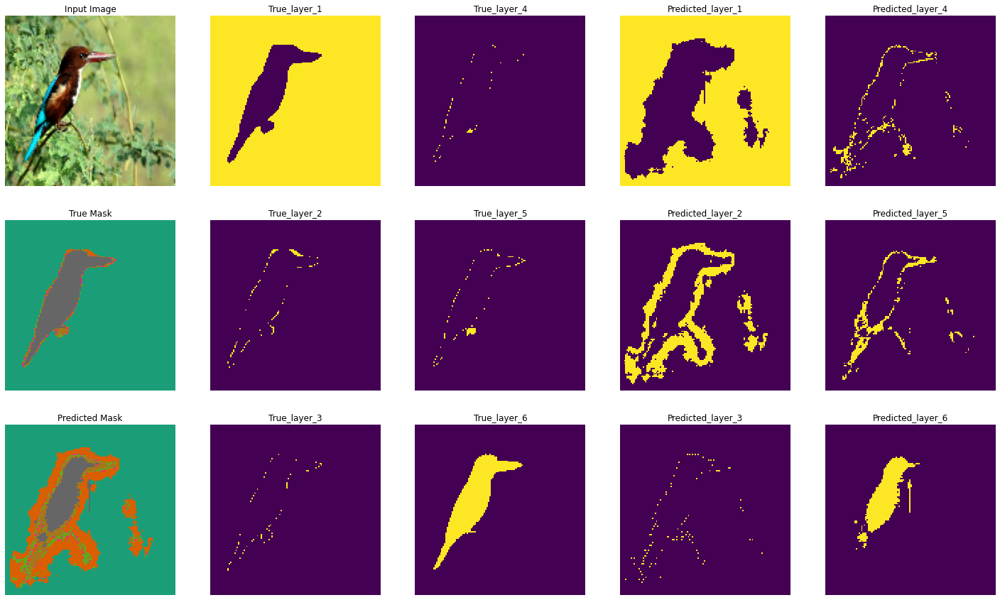

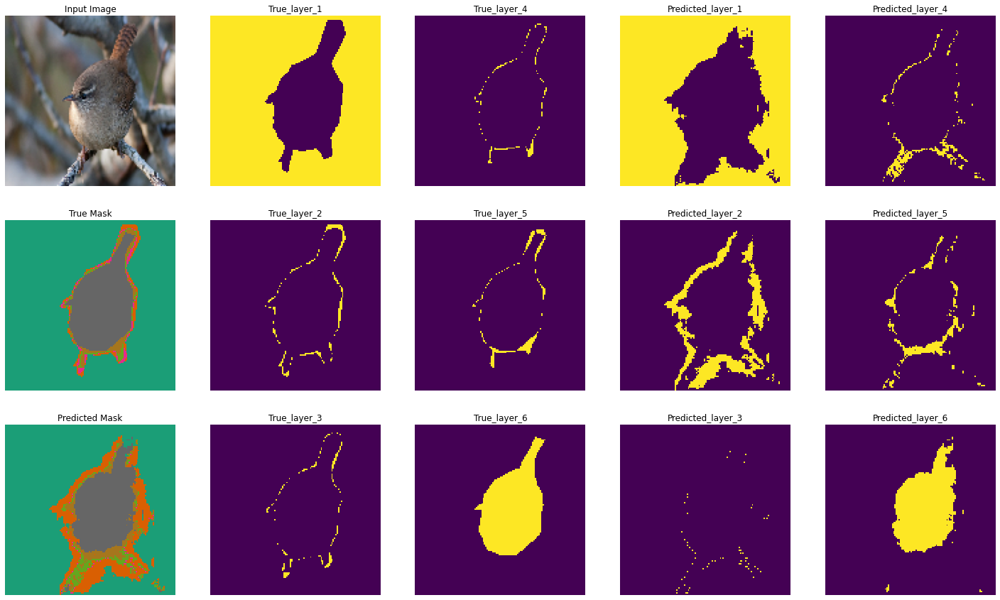

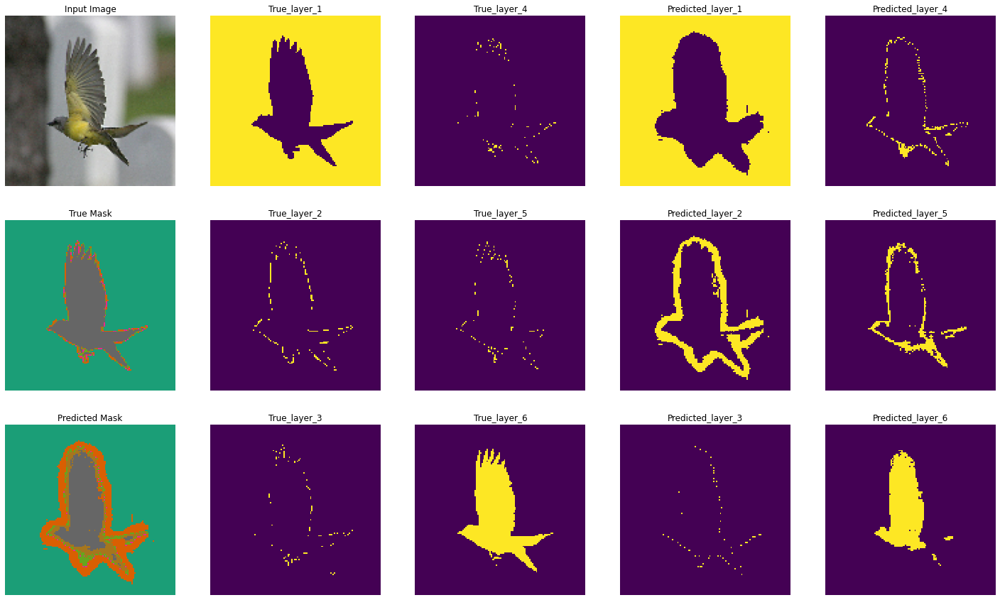

CPU times: user 3min 57s, sys: 14.1 s, total: 4min 12s
Wall time: 2min 48s


In [ ]:
%%time

score_best = nn(train_dataset, test_dataset, sample_image, sample_mask, num_test_examp, 
       STEPS_PER_EPOCH, OUTPUT_CHANNELS, BATCH_SIZE, down_stack_trainable=False, deep=5, 
        start_weights=None, auto_weights=True, epochs=20, full=True, highlight=True,
          num_image=3)

In [ ]:
score_best

0.5574451088905334

### auto_weights

Сравним с тем, если бы мы обучались без автоматического взвешивания

Epoch 1/20
37/37 [==============================] - 10s 169ms/step - loss: 86112.4062 - score: 0.1934 - val_loss: 39592.3828 - val_score: 0.1978
Epoch 2/20
37/37 [==============================] - 5s 133ms/step - loss: 42338.5742 - score: 0.1936 - val_loss: 38385.3008 - val_score: 0.1967
Epoch 3/20
37/37 [==============================] - 5s 136ms/step - loss: 40006.9414 - score: 0.2003 - val_loss: 34082.8359 - val_score: 0.2324
Epoch 4/20
37/37 [==============================] - 6s 164ms/step - loss: 36282.7344 - score: 0.2336 - val_loss: 32080.4160 - val_score: 0.2461
Epoch 5/20
37/37 [==============================] - 5s 134ms/step - loss: 33533.6133 - score: 0.2484 - val_loss: 31870.3184 - val_score: 0.2422
Epoch 6/20
37/37 [==============================] - 5s 133ms/step - loss: 30462.8184 - score: 0.2649 - val_loss: 27008.0371 - val_score: 0.2770
Epoch 7/20
37/37 [==============================] - 5s 134ms/step - loss: 27423.9922 - score: 0.2905 - val_loss: 26891.9473 - val_score

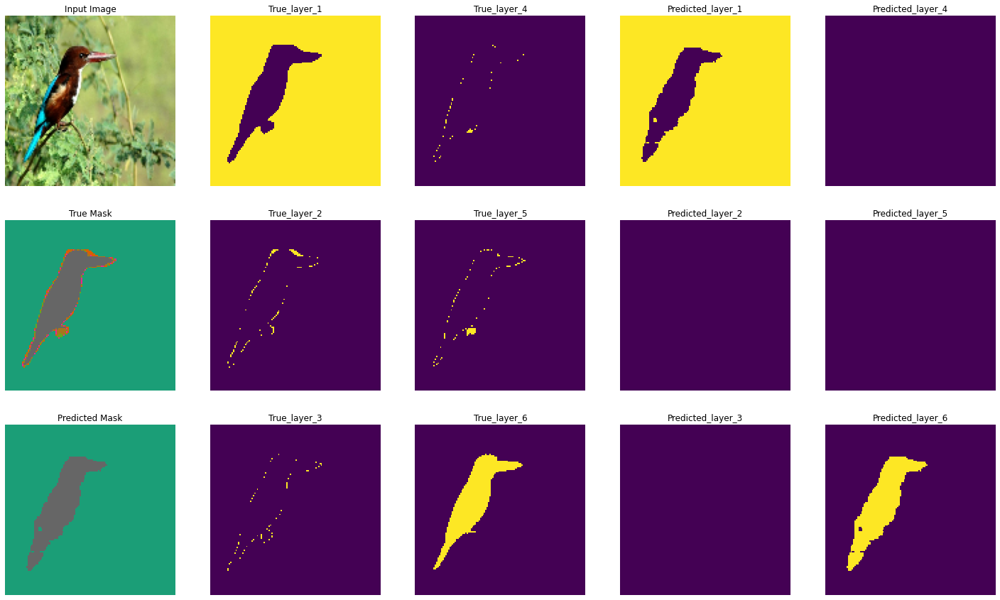

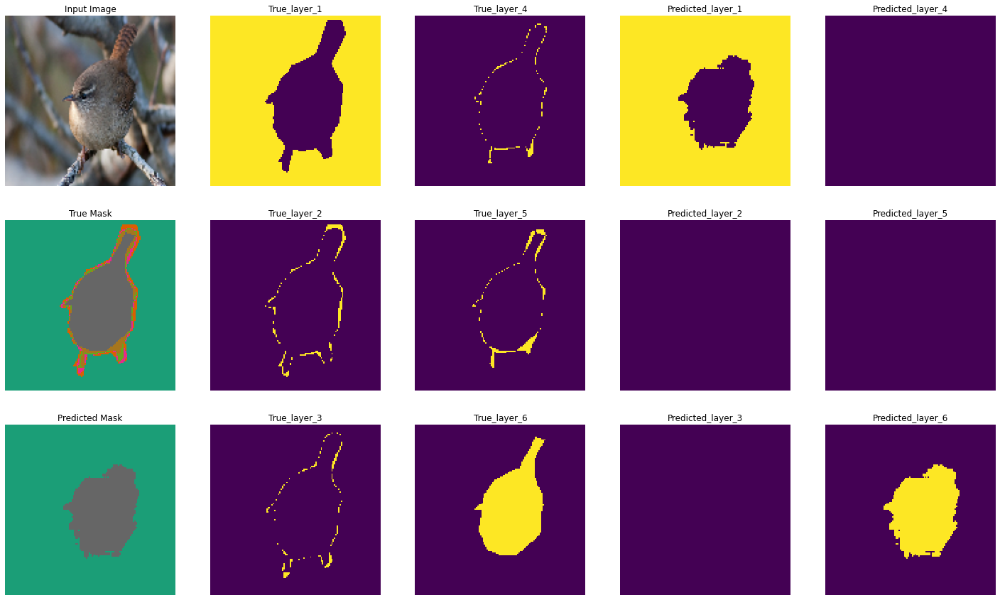

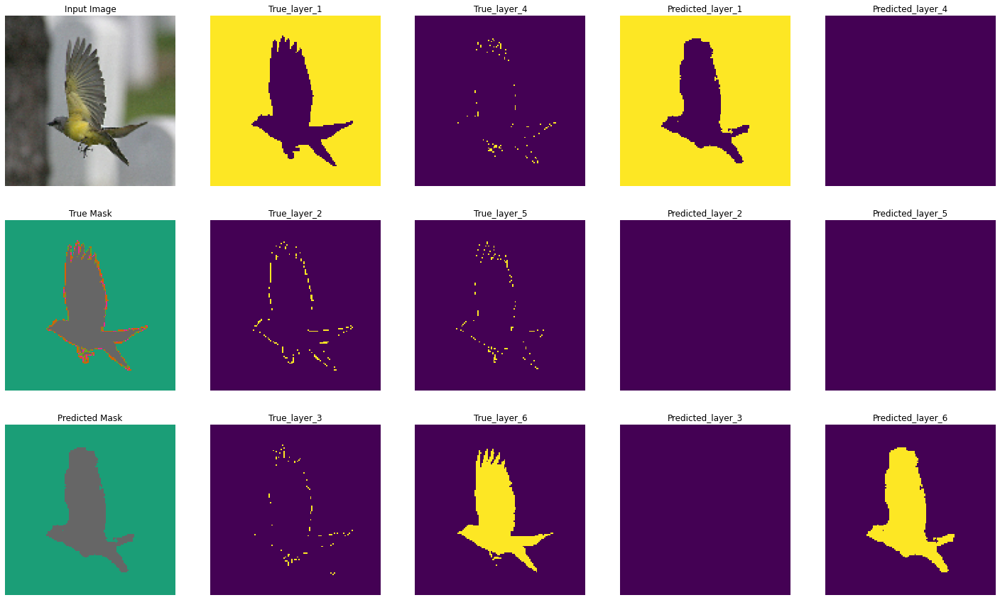

CPU times: user 1min 39s, sys: 9.48 s, total: 1min 48s
Wall time: 2min 31s


In [ ]:
%%time

score_not_weights = nn(train_dataset, test_dataset, sample_image, sample_mask, num_test_examp, 
       STEPS_PER_EPOCH, OUTPUT_CHANNELS, BATCH_SIZE, down_stack_trainable=False, deep=5, 
        start_weights=False, auto_weights=False, epochs=EPOCHS, full=True, highlight=True,
          num_image=3)

In [ ]:
score_best, score_not_weights

(0.5574451088905334, 0.3551766872406006)

Модель с автоматическими весами сильнее реагирует на неправильно проставленные пиксели маленьких классов. Это заставляет модель проставлять пискели маленьких классов (2,3,4,5) так же точно, как и больших (1 и 6). Но так как чёткой зависимости нету и эти классы слишком маленькие относительно других, то модель сильно ошибается в них и даёт большой loss. Модель без весов не справилась с задачей, так как она даже не пыталась угадывать маленькие классы, ведь это не имеет смысла, так как большие классы с чёткими зависимостями угадывать проще, а ошибки наказываются одинаково, поэтому она сконцентрировала своё внимание на больших классах.

### start_weights

Попробуем задать правильные веса вручную.

Для сравнения вычислим автоматические веса случайного изображения:

In [ ]:
weights = K.sum(K.sum(mask[0], 0), 0)
weights = K.sum(weights, 0, keepdims=True) / weights
weights

<tf.Tensor: shape=(6,), dtype=float32, numpy=
array([ 1.3516966, 12.556782 , 29.96035  , 87.282684 , 61.702408 ,
        8.367536 ], dtype=float32)>

Epoch 1/20
37/37 [==============================] - 10s 171ms/step - loss: 306190.1250 - score: 0.2232 - val_loss: 239598.2344 - val_score: 0.3096
Epoch 2/20
37/37 [==============================] - 5s 139ms/step - loss: 252185.4844 - score: 0.2994 - val_loss: 216465.7031 - val_score: 0.3269
Epoch 3/20
37/37 [==============================] - 6s 165ms/step - loss: 229217.8594 - score: 0.3322 - val_loss: 209219.2812 - val_score: 0.3556
Epoch 4/20
37/37 [==============================] - 5s 137ms/step - loss: 222758.3438 - score: 0.3776 - val_loss: 197936.2344 - val_score: 0.3844
Epoch 5/20
37/37 [==============================] - 5s 136ms/step - loss: 216716.8594 - score: 0.4120 - val_loss: 193766.4219 - val_score: 0.4039
Epoch 6/20
37/37 [==============================] - 5s 136ms/step - loss: 206696.2969 - score: 0.4342 - val_loss: 187413.3438 - val_score: 0.4447
Epoch 7/20
37/37 [==============================] - 5s 135ms/step - loss: 193188.9062 - score: 0.4461 - val_loss: 180806.64

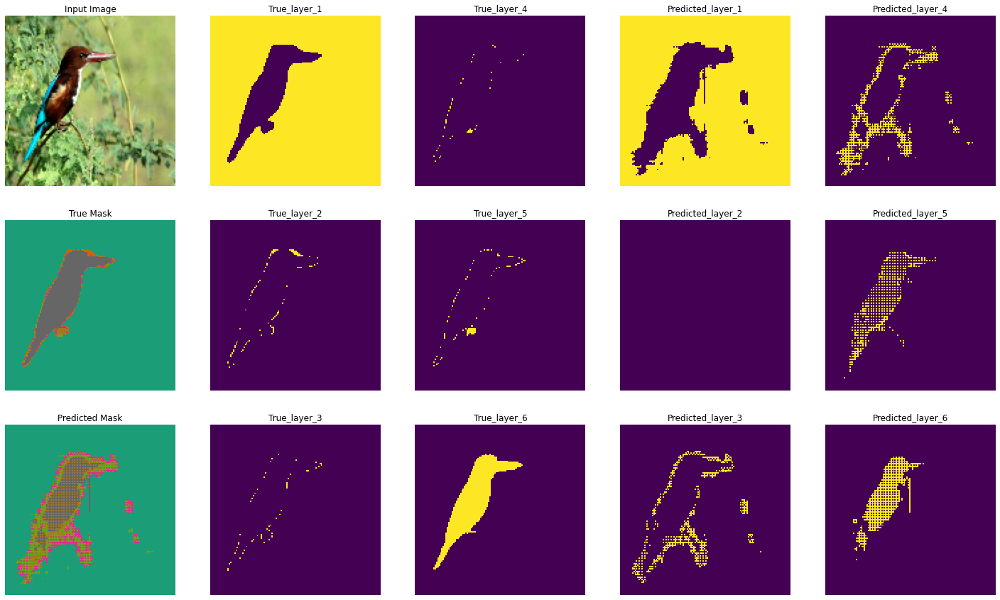

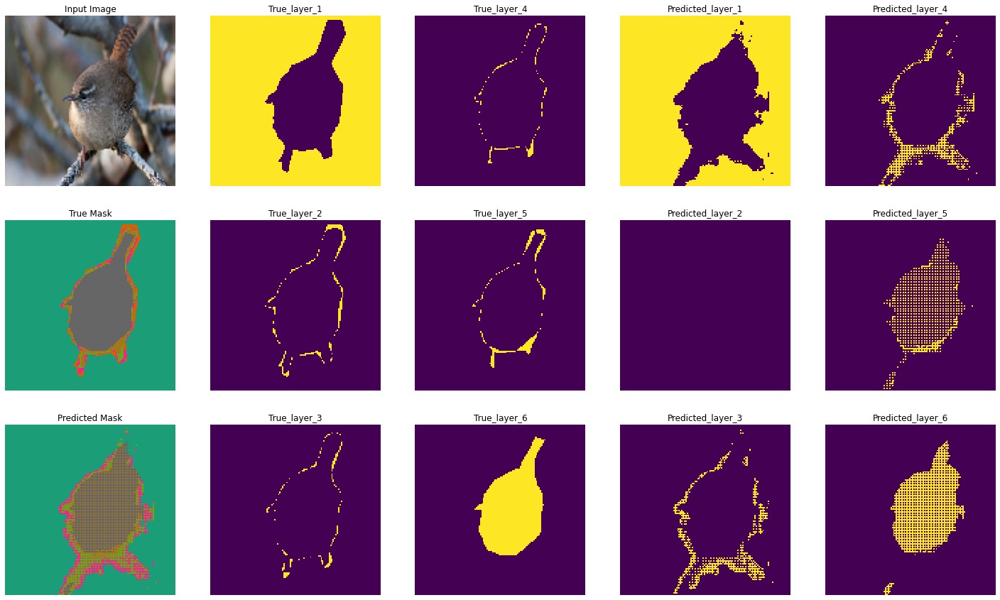

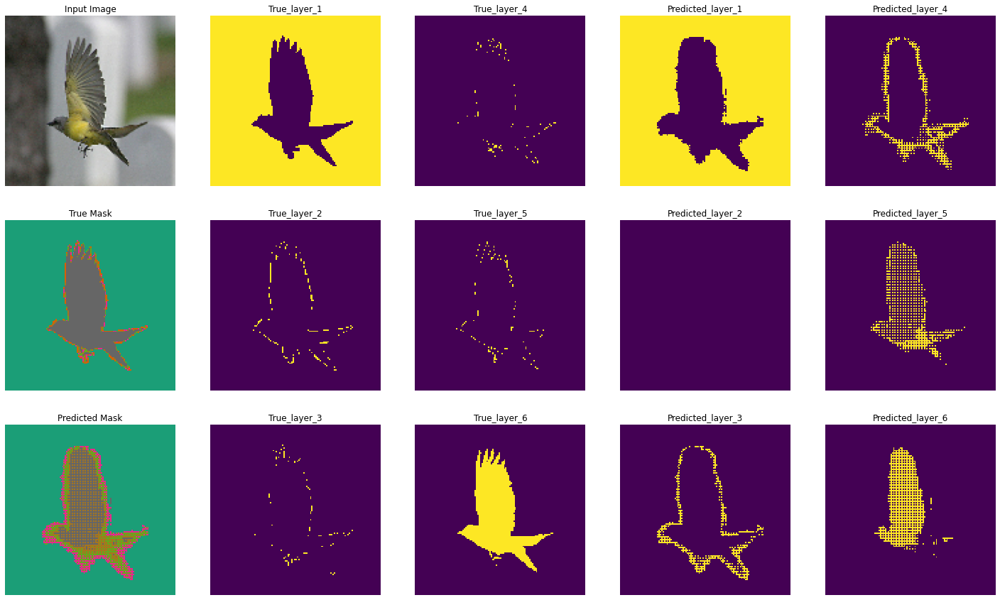

CPU times: user 1min 39s, sys: 10.4 s, total: 1min 49s
Wall time: 2min 30s


In [ ]:
%%time

start_weights = [1,10,25,30,14,2]

score_start_weights = nn(train_dataset, test_dataset, sample_image, sample_mask, num_test_examp, 
       STEPS_PER_EPOCH, OUTPUT_CHANNELS, BATCH_SIZE, down_stack_trainable=False, deep=5, 
        start_weights=start_weights, auto_weights=False, epochs=EPOCHS, full=True, highlight=True,
          num_image=3)

In [ ]:
score_best, score_start_weights, score_not_weights

(0.5574451088905334, 0.4790787100791931, 0.3551766872406006)

Видно, что при ручной подгонке весов можно добиться лучших результатов, чем вообще без весов, но хуже, чем с автоматическими весами. При использовании автоматических весов, сами веса вычисляются для каждого изображения. А при ручной подгонке одни веса для всех изображений. Поэтому для каких то изображений, где соотношение классов сильно отличается от остальных изображений, веса будут неправильными и обучение ухудшется. Поэтому модель с весами подобранными вручную показывает результаты хуже модели с автоматическими весами для нашей задачи, уметь предсказывать каждый класс, так как она не пыталась предсказать 2 класс.

### deep

Посмотрим, как различаются предсказания моделей u-net и их метрики от глубины. А так же посмотрим на случайные карты скрытого слоя последнего изображения для каждой глубины.

deep = 1
Epoch 1/20
37/37 [==============================] - 4s 91ms/step - loss: 1061285.2500 - score: 0.2213 - val_loss: 1008557.3125 - val_score: 0.2596
Epoch 2/20
37/37 [==============================] - 3s 80ms/step - loss: 987800.1875 - score: 0.2769 - val_loss: 968021.8125 - val_score: 0.2894
Epoch 3/20
37/37 [==============================] - 3s 80ms/step - loss: 957711.6875 - score: 0.2967 - val_loss: 955311.0625 - val_score: 0.2987
Epoch 4/20
37/37 [==============================] - 3s 80ms/step - loss: 961889.7500 - score: 0.2979 - val_loss: 947345.5625 - val_score: 0.3046
Epoch 5/20
37/37 [==============================] - 3s 78ms/step - loss: 946609.3125 - score: 0.3081 - val_loss: 938745.8125 - val_score: 0.3109
Epoch 6/20
37/37 [==============================] - 3s 79ms/step - loss: 938480.3125 - score: 0.3145 - val_loss: 931971.3125 - val_score: 0.3159
Epoch 7/20
37/37 [==============================] - 3s 77ms/step - loss: 926224.6250 - score: 0.3205 - val_loss: 927979

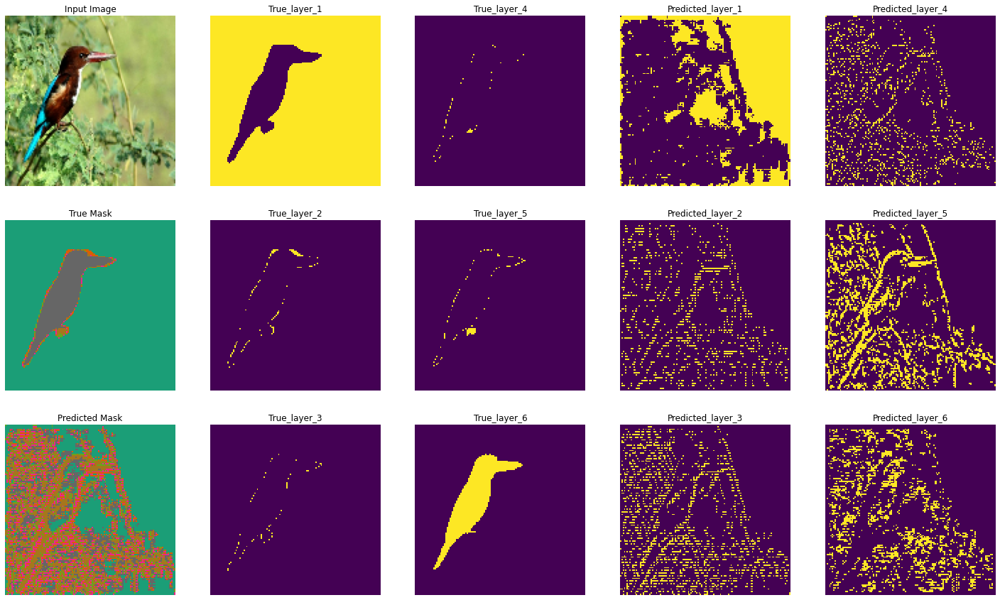

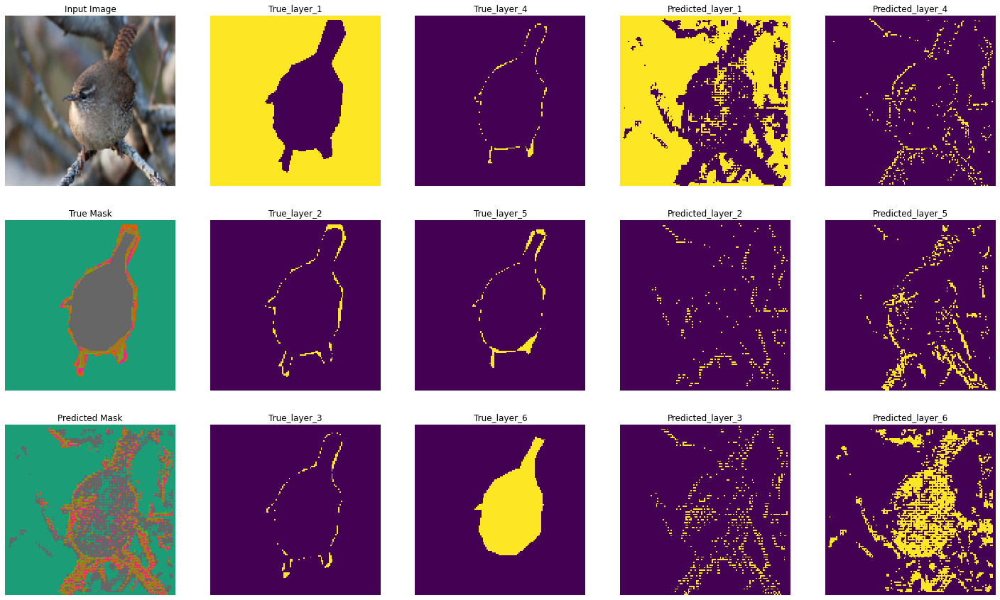

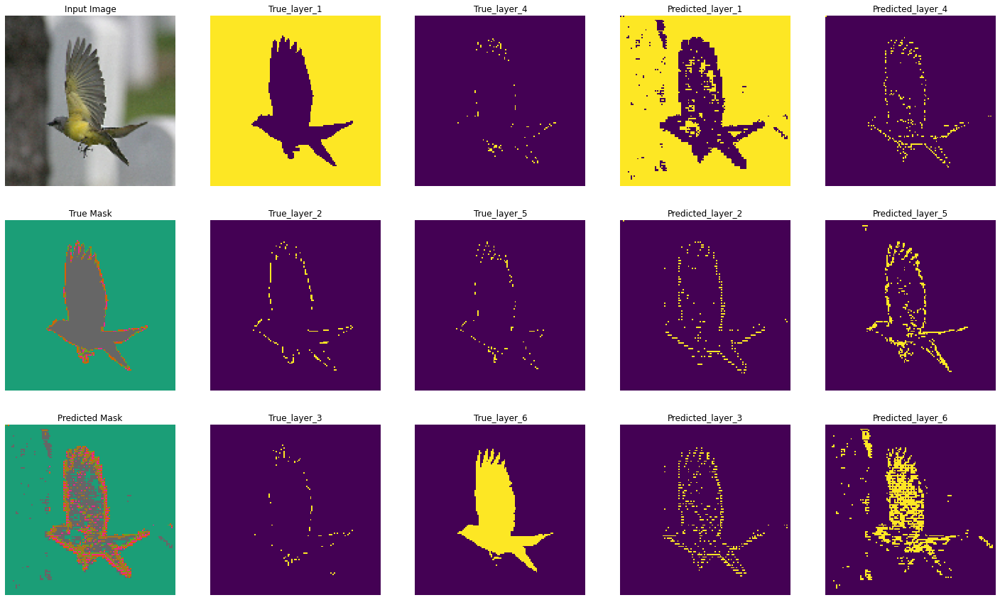

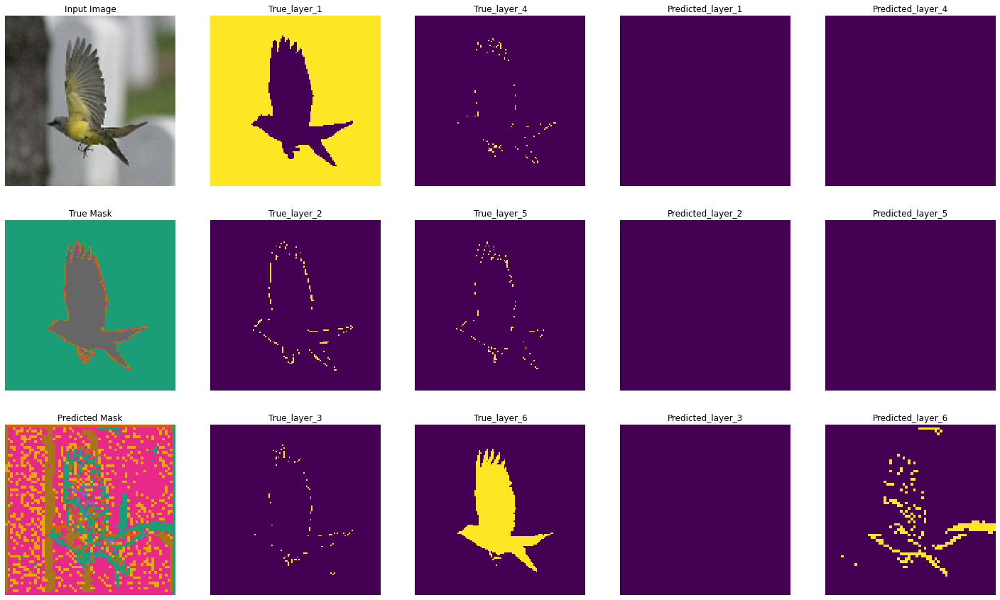

deep = 2
Epoch 1/20
37/37 [==============================] - 11s 200ms/step - loss: 999800.5625 - score: 0.2667 - val_loss: 924573.6875 - val_score: 0.3213
Epoch 2/20
37/37 [==============================] - 6s 174ms/step - loss: 872457.3125 - score: 0.3605 - val_loss: 850288.8125 - val_score: 0.3758
Epoch 3/20
37/37 [==============================] - 6s 176ms/step - loss: 819280.2500 - score: 0.3996 - val_loss: 815538.0000 - val_score: 0.4013
Epoch 4/20
37/37 [==============================] - 5s 143ms/step - loss: 808796.1875 - score: 0.4094 - val_loss: 801759.0625 - val_score: 0.4115
Epoch 5/20
37/37 [==============================] - 5s 148ms/step - loss: 784891.3750 - score: 0.4259 - val_loss: 791129.4375 - val_score: 0.4193
Epoch 6/20
37/37 [==============================] - 5s 146ms/step - loss: 784648.7500 - score: 0.4265 - val_loss: 784719.3125 - val_score: 0.4240
Epoch 7/20
37/37 [==============================] - 4s 122ms/step - loss: 777863.0625 - score: 0.4307 - val_loss: 

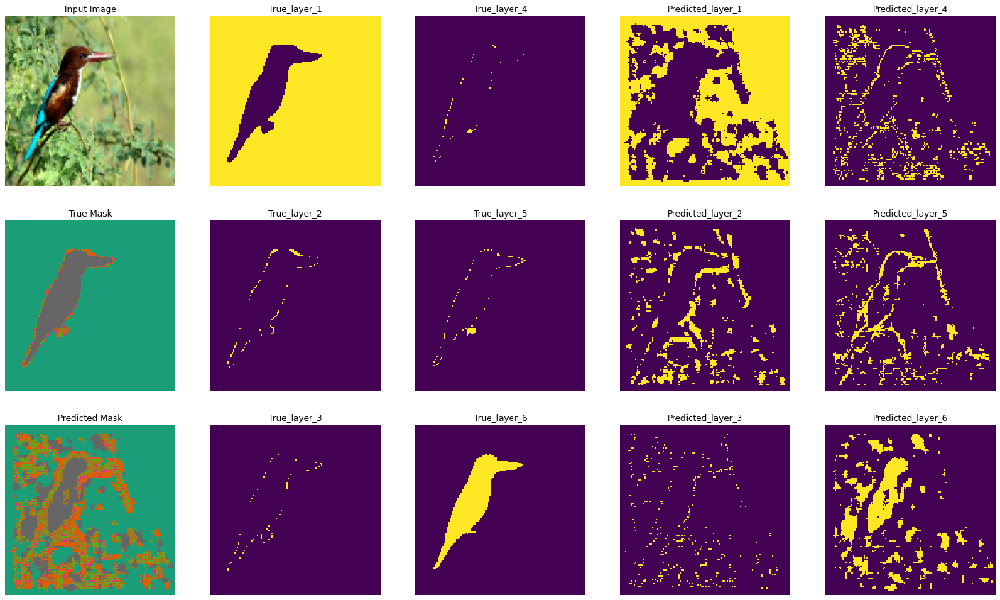

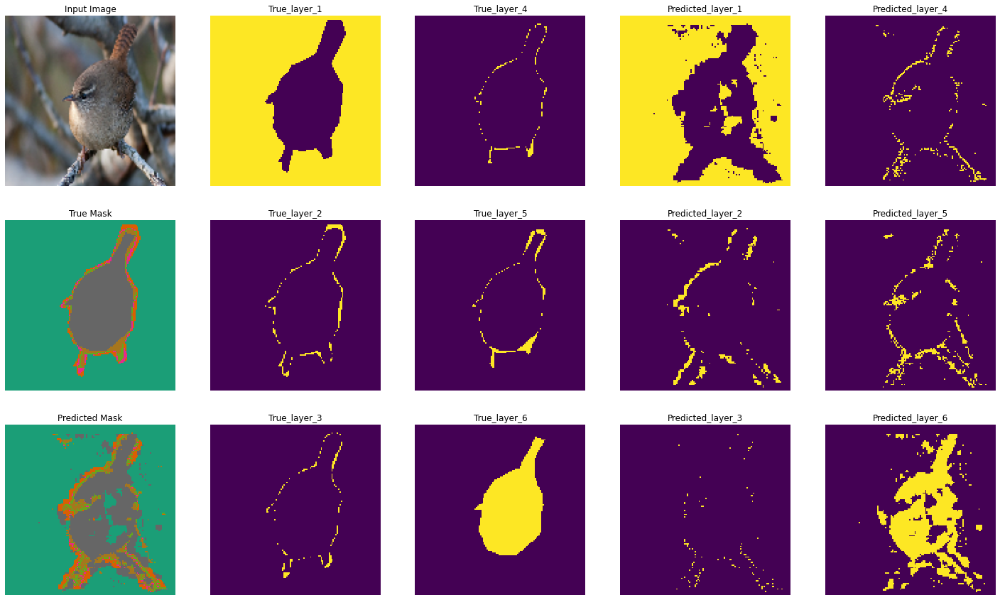

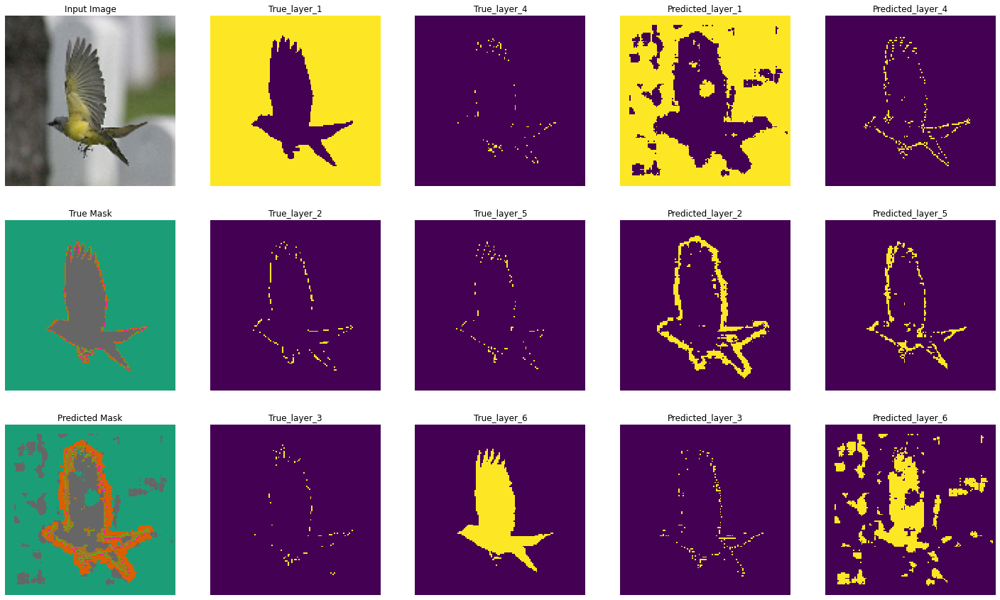

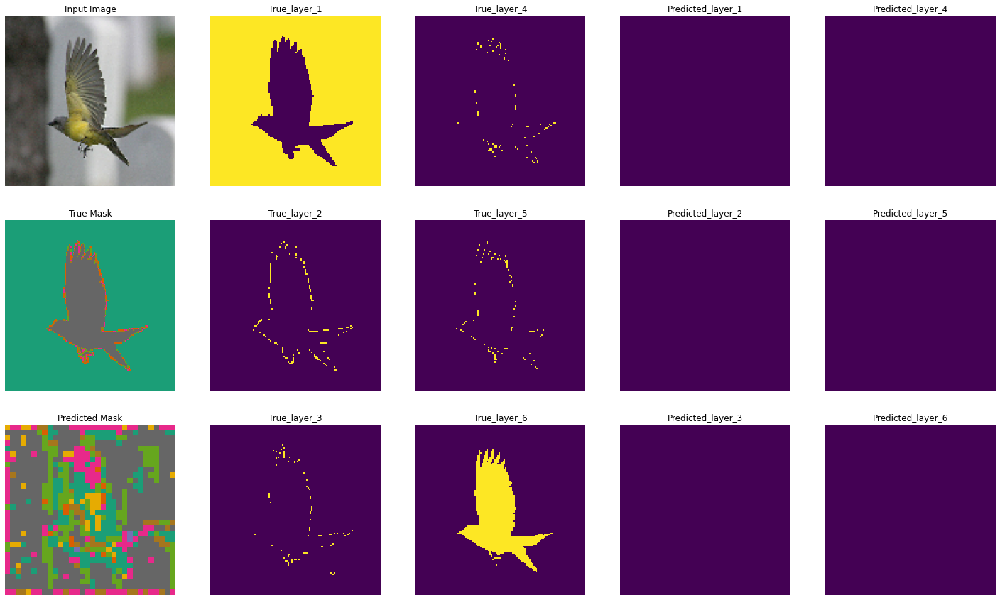

deep = 3
Epoch 1/20
37/37 [==============================] - 7s 133ms/step - loss: 957271.6875 - score: 0.2987 - val_loss: 834027.5625 - val_score: 0.3877
Epoch 2/20
37/37 [==============================] - 4s 110ms/step - loss: 793331.5625 - score: 0.4183 - val_loss: 771105.3750 - val_score: 0.4339
Epoch 3/20
37/37 [==============================] - 4s 111ms/step - loss: 759911.6250 - score: 0.4424 - val_loss: 755248.3750 - val_score: 0.4456
Epoch 4/20
37/37 [==============================] - 4s 110ms/step - loss: 755638.0625 - score: 0.4488 - val_loss: 740429.0625 - val_score: 0.4565
Epoch 5/20
37/37 [==============================] - 4s 111ms/step - loss: 722735.9375 - score: 0.4705 - val_loss: 731168.1875 - val_score: 0.4633
Epoch 6/20
37/37 [==============================] - 4s 110ms/step - loss: 720571.5625 - score: 0.4745 - val_loss: 713647.5625 - val_score: 0.4761
Epoch 7/20
37/37 [==============================] - 4s 110ms/step - loss: 717483.0625 - score: 0.4740 - val_loss: 7

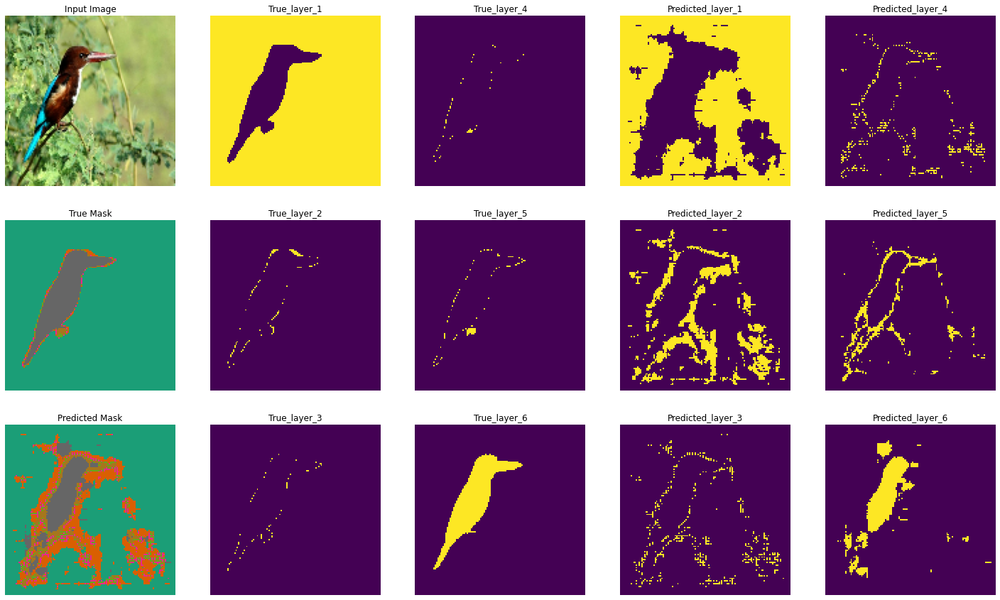

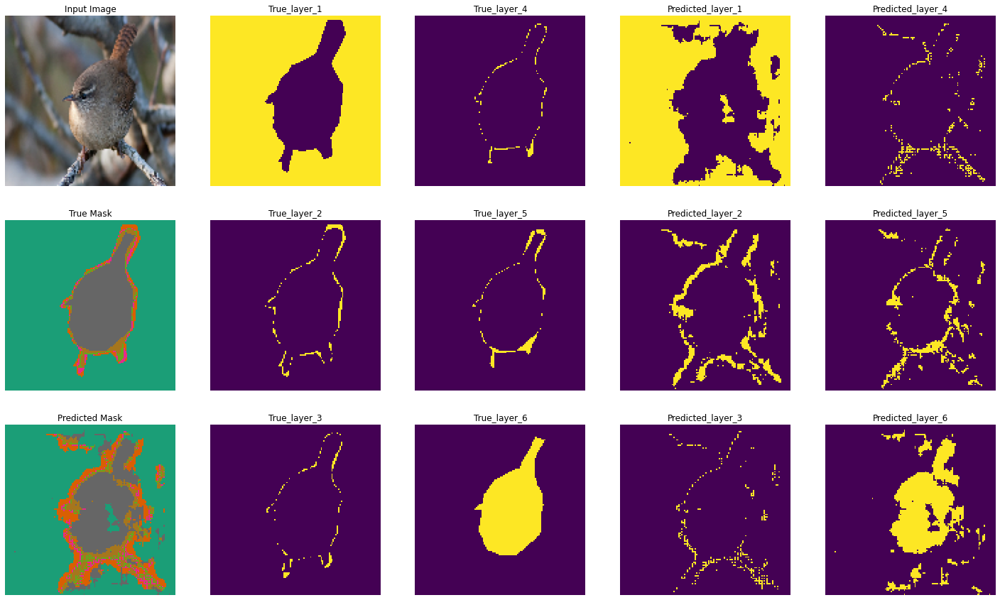

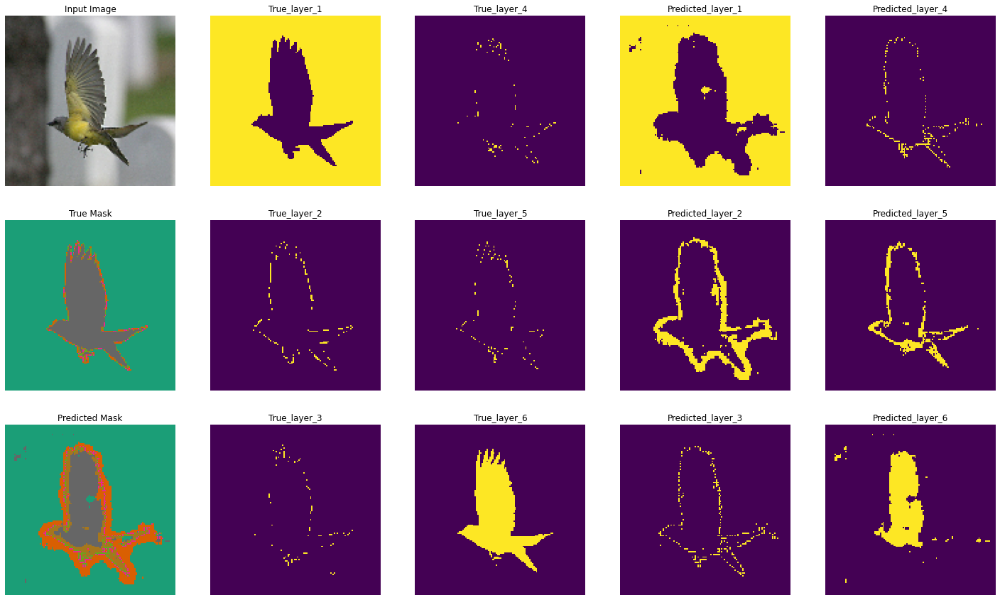

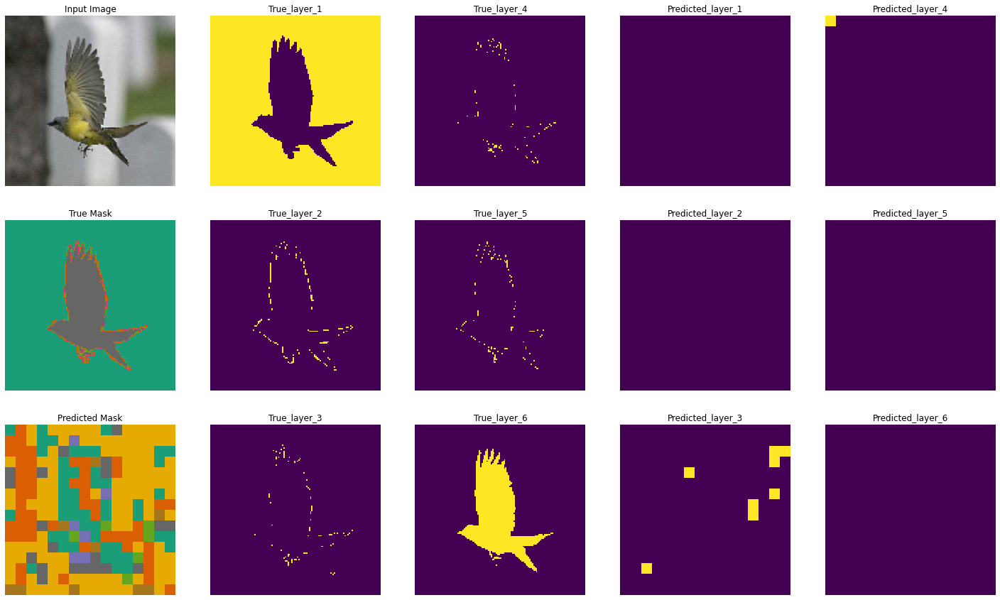

deep = 4
Epoch 1/20
37/37 [==============================] - 10s 160ms/step - loss: 911820.4375 - score: 0.3314 - val_loss: 762887.0000 - val_score: 0.4399
Epoch 2/20
37/37 [==============================] - 5s 127ms/step - loss: 729389.5000 - score: 0.4661 - val_loss: 700780.3750 - val_score: 0.4855
Epoch 3/20
37/37 [==============================] - 5s 127ms/step - loss: 685925.4375 - score: 0.4958 - val_loss: 683005.5000 - val_score: 0.4986
Epoch 4/20
37/37 [==============================] - 5s 128ms/step - loss: 679914.0000 - score: 0.5034 - val_loss: 661117.5000 - val_score: 0.5147
Epoch 5/20
37/37 [==============================] - 5s 127ms/step - loss: 659721.5625 - score: 0.5173 - val_loss: 660544.0000 - val_score: 0.5151
Epoch 6/20
37/37 [==============================] - 5s 128ms/step - loss: 652469.2500 - score: 0.5240 - val_loss: 643805.3125 - val_score: 0.5274
Epoch 7/20
37/37 [==============================] - 5s 129ms/step - loss: 648186.1875 - score: 0.5249 - val_loss: 

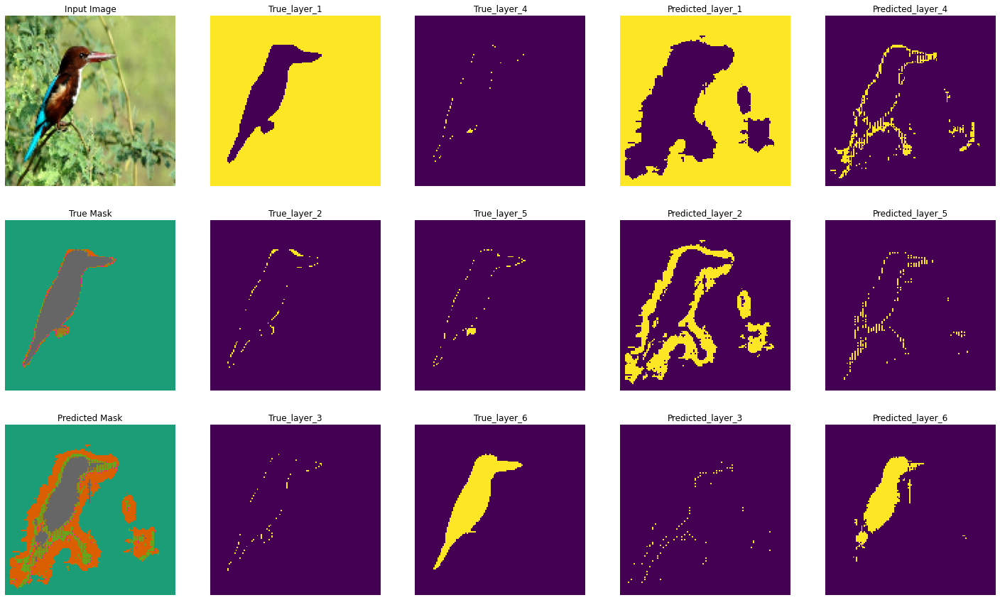

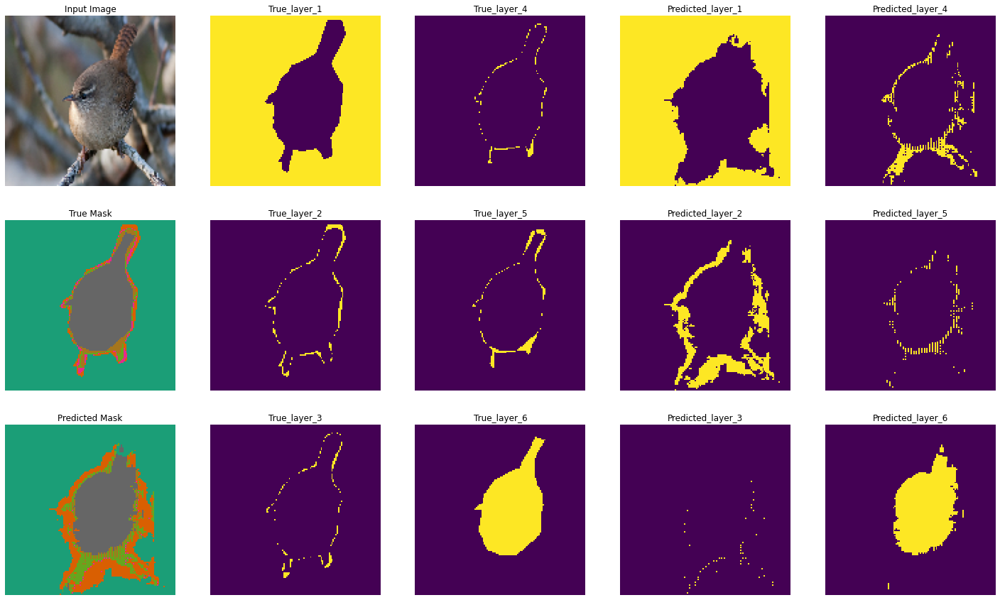

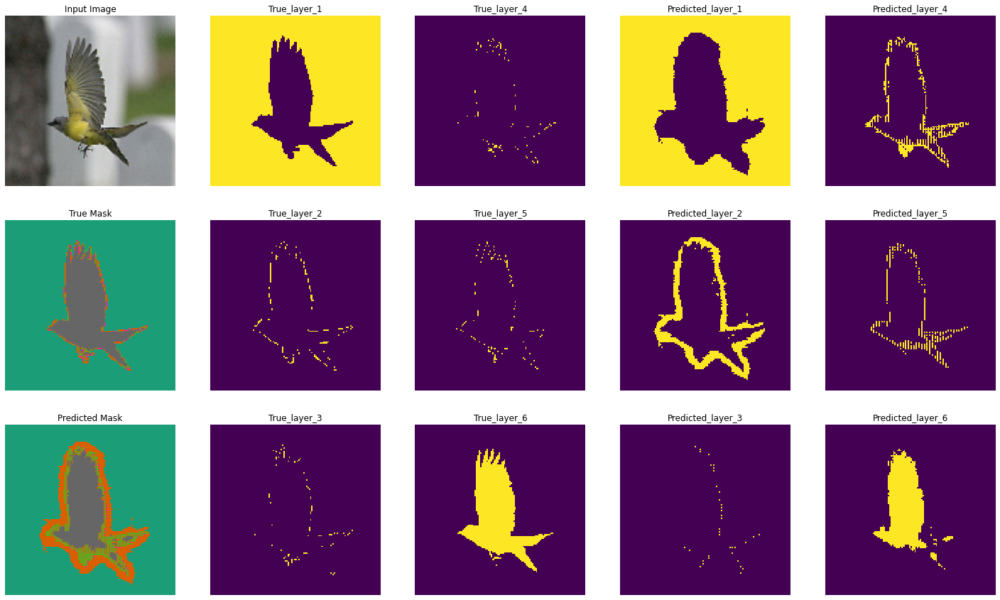

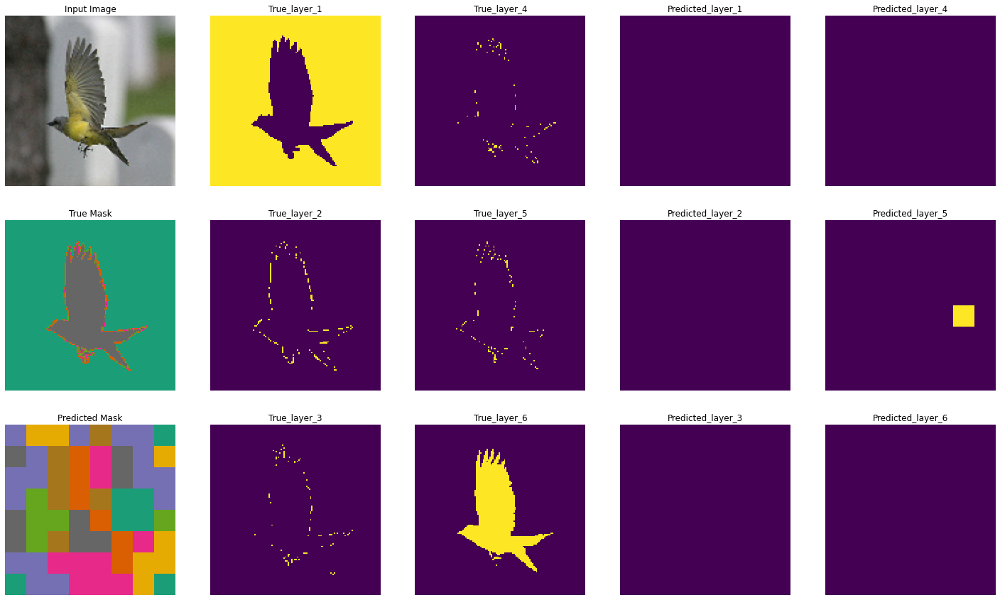

deep = 5
Epoch 1/20
37/37 [==============================] - 11s 189ms/step - loss: 911351.1250 - score: 0.3324 - val_loss: 786423.3750 - val_score: 0.4227
Epoch 2/20
37/37 [==============================] - 5s 148ms/step - loss: 727405.7500 - score: 0.4667 - val_loss: 715498.9375 - val_score: 0.4747
Epoch 3/20
37/37 [==============================] - 5s 147ms/step - loss: 689750.1875 - score: 0.4939 - val_loss: 710241.0000 - val_score: 0.4786
Epoch 4/20
37/37 [==============================] - 5s 146ms/step - loss: 672627.6250 - score: 0.5081 - val_loss: 666151.0000 - val_score: 0.5110
Epoch 5/20
37/37 [==============================] - 5s 145ms/step - loss: 656043.0000 - score: 0.5203 - val_loss: 656798.8750 - val_score: 0.5179
Epoch 6/20
37/37 [==============================] - 5s 145ms/step - loss: 647431.1875 - score: 0.5275 - val_loss: 642769.6875 - val_score: 0.5282
Epoch 7/20
37/37 [==============================] - 5s 148ms/step - loss: 643413.1250 - score: 0.5285 - val_loss: 

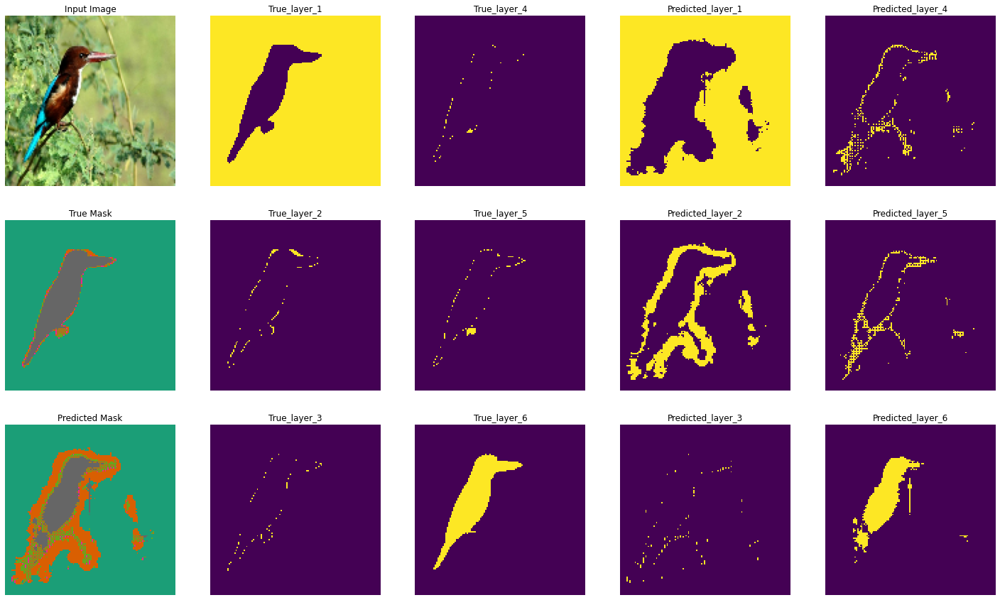

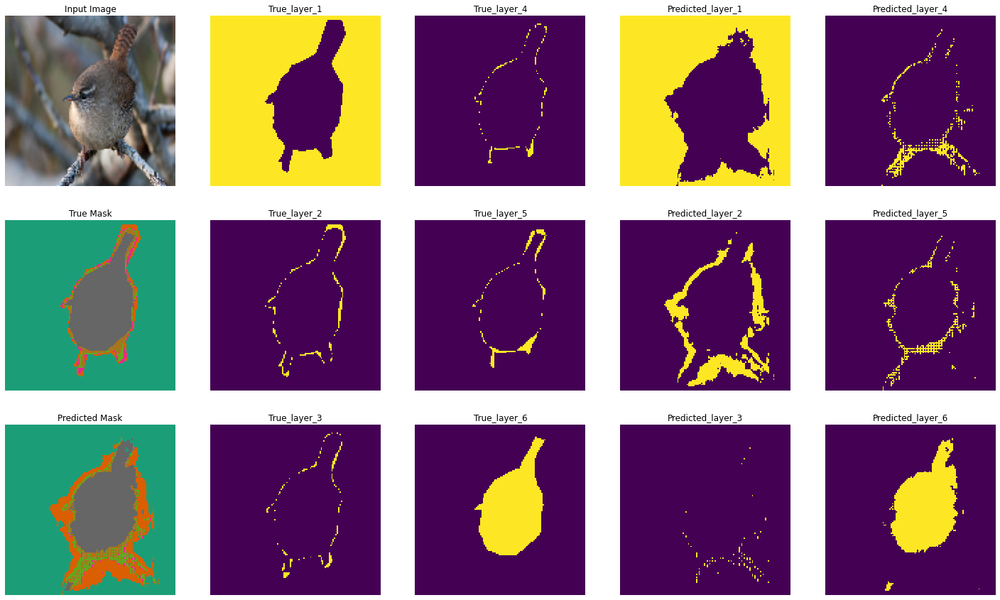

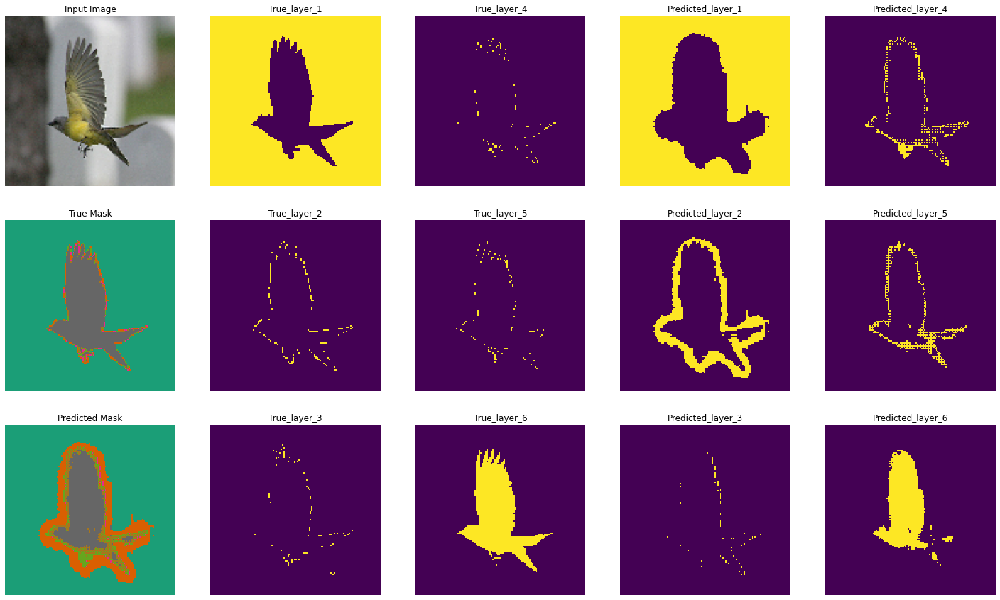

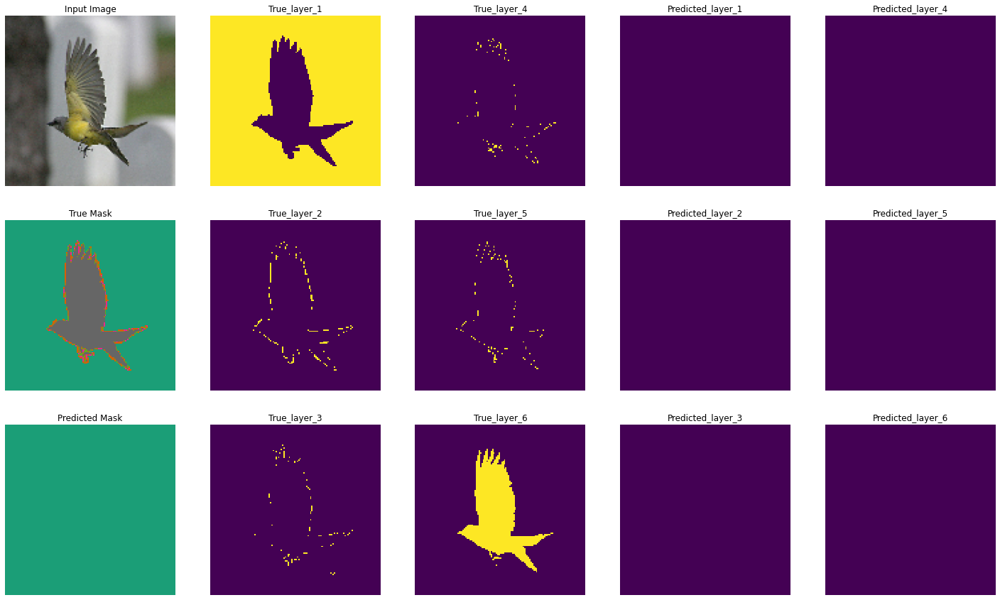

CPU times: user 8min 31s, sys: 50.1 s, total: 9min 21s
Wall time: 10min 42s


In [ ]:
%%time

values = [1, 2, 3, 4, 5]
score_deep = {}

for i in values:
  print(f'deep = {i}')
  score_deep[f'deep_{i}'] = nn(train_dataset, test_dataset, sample_image, sample_mask, num_test_examp, 
       STEPS_PER_EPOCH, OUTPUT_CHANNELS, BATCH_SIZE, down_stack_trainable=False, deep=i, 
        start_weights=False, auto_weights=True, epochs=EPOCHS, full=True, highlight=True,
          num_image=3, hidden_layer=True)

In [ ]:
score_deep

{'deep_1': 0.3398591876029968,
 'deep_2': 0.4519098103046417,
 'deep_3': 0.5055884718894958,
 'deep_4': 0.548230767250061,
 'deep_5': 0.5532534122467041}

Видно, что при глубине u-net = 1, тоесть где карты скрытого слоя имеют размерность 64х64, модель явно недообучается. И чем больше глубина, тем сложнее модель и тем лучше она обучается. Так же можно заметить, что чем глубже модель, тем меньшего размера у неё изображения hidden_layer и тем меньше информации в себе несёт каждая карта по отдельности, тем более для человека, но так как их много, то модель хорошо обучается. Видно, что сложно поймать карты, где будет много пикселей разного цвета.

### down_stack_trainable

Epoch 1/20
37/37 [==============================] - 10s 174ms/step - loss: 916697.3750 - score: 0.3277 - val_loss: 786364.4375 - val_score: 0.4227
Epoch 2/20
37/37 [==============================] - 5s 141ms/step - loss: 722716.9375 - score: 0.4709 - val_loss: 710429.1250 - val_score: 0.4784
Epoch 3/20
37/37 [==============================] - 5s 138ms/step - loss: 690557.0000 - score: 0.4931 - val_loss: 675167.4375 - val_score: 0.5044
Epoch 4/20
37/37 [==============================] - 5s 138ms/step - loss: 672369.0000 - score: 0.5086 - val_loss: 663947.0000 - val_score: 0.5126
Epoch 5/20
37/37 [==============================] - 5s 139ms/step - loss: 662558.6250 - score: 0.5160 - val_loss: 660671.5000 - val_score: 0.5150
Epoch 6/20
37/37 [==============================] - 5s 141ms/step - loss: 651121.1250 - score: 0.5241 - val_loss: 646341.4375 - val_score: 0.5255
Epoch 7/20
37/37 [==============================] - 5s 140ms/step - loss: 642453.1875 - score: 0.5293 - val_loss: 641211.62

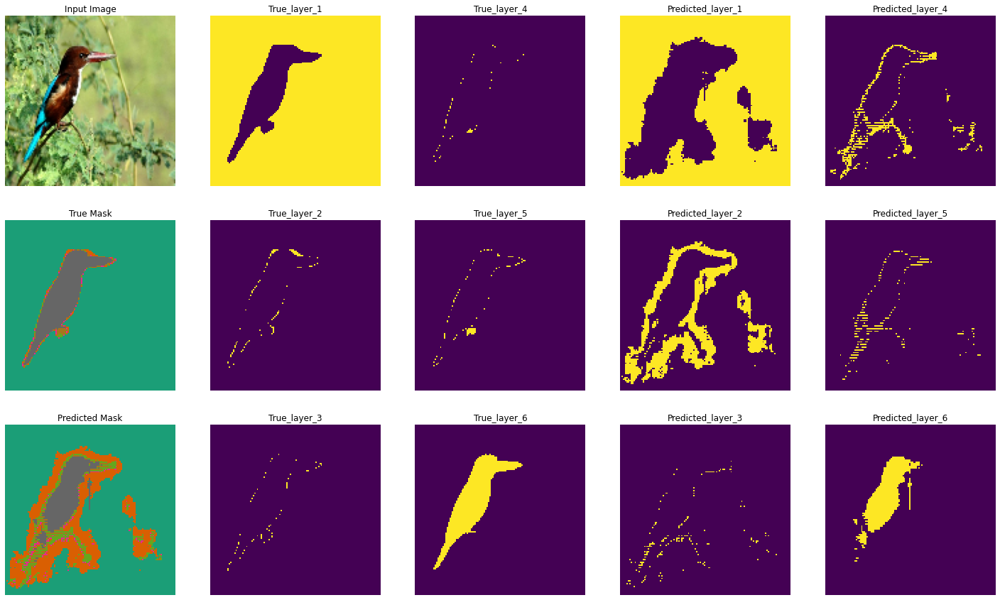

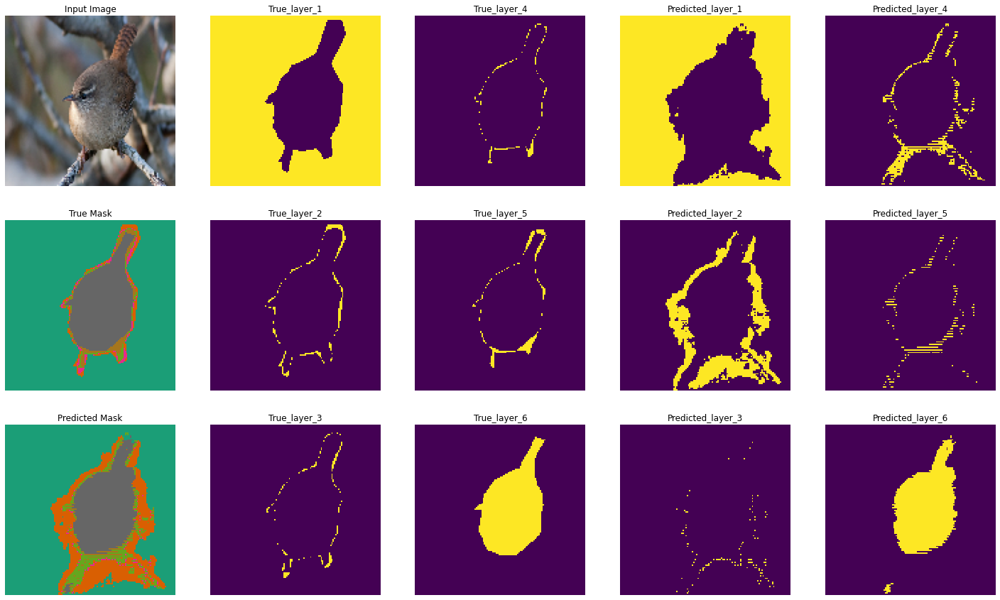

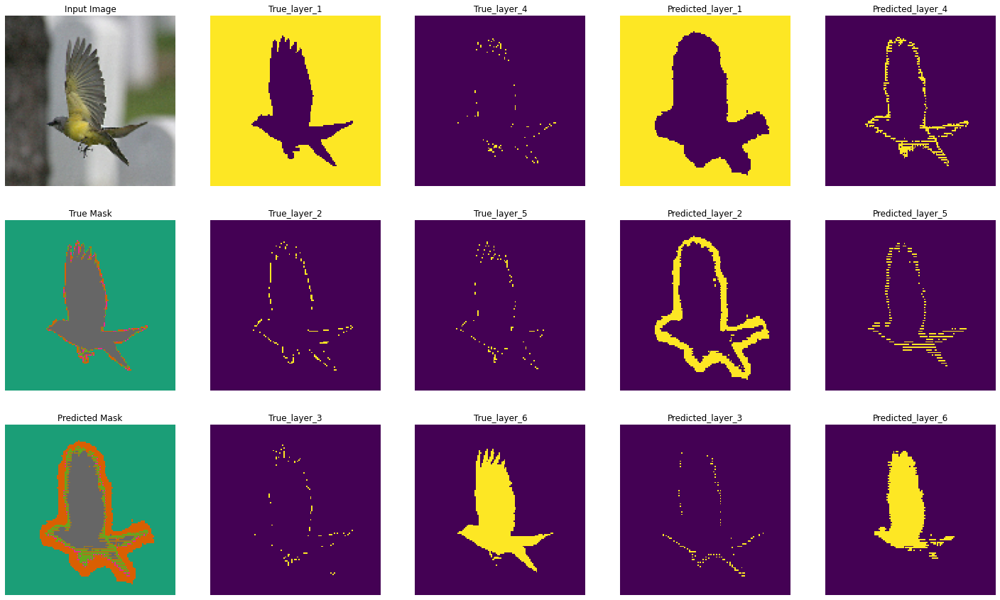

CPU times: user 1min 53s, sys: 11.7 s, total: 2min 5s
Wall time: 1min 53s


In [ ]:
%%time

score_with_down_stack = nn(train_dataset, test_dataset, sample_image, sample_mask, num_test_examp, 
       STEPS_PER_EPOCH, OUTPUT_CHANNELS, BATCH_SIZE, down_stack_trainable=True, deep=5, 
        start_weights=False, auto_weights=True, epochs=EPOCHS, full=True, highlight=True,
          num_image=3)

In [ ]:
score_best, score_with_down_stack 

(0.5574451088905334, 0.5513157844543457)

При down_stack_trainable = True результат немного хуже, чем при down_stack_trainable = False. Так как при down_stack_trainable = True у нас обучается часть сети u-net отвечающая за энкодер. Но энкодер у нас и так отлично обучен сетью MobileNetV2 в отличии от части отвечающей за декодер.

### Generating examples

Попробуем улучшить наши предсказания сгенерировав искусственные данные с помощью отзеркаливания наших исходных данных.

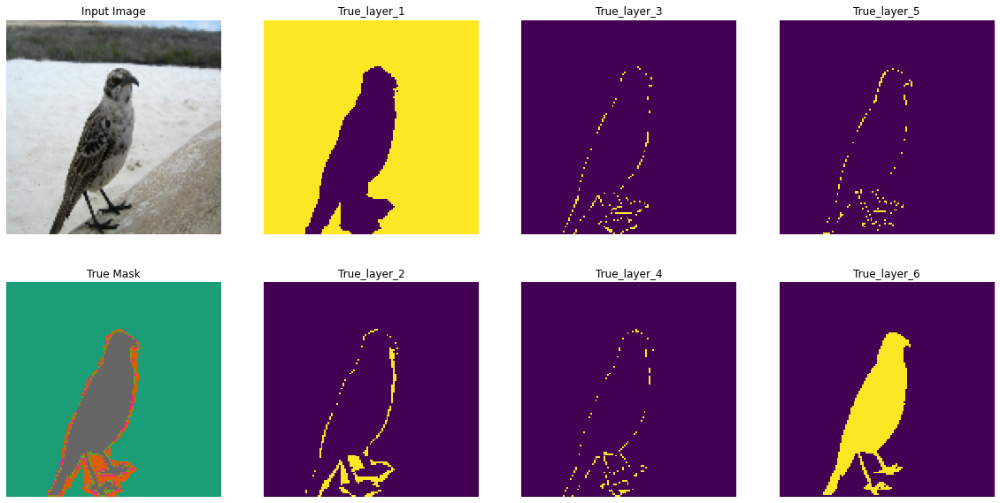

In [ ]:
display([tf.image.flip_left_right(sample_image)[1,:,:,:], 
         tf.image.flip_left_right(sample_mask)[1,:,:,:]], full=True, highlight=True)

In [ ]:
@tf.function
def mirroring(image, mask):

  new_image = tf.image.flip_left_right(image)
  new_mask = tf.image.flip_left_right(mask)

  return new_image, new_mask

In [ ]:
new_train = train.concatenate(train.map(mirroring))

In [ ]:
NEW_BATCH_SIZE = BATCH_SIZE//2

In [ ]:
new_train_dataset = new_train.cache().shuffle(BUFFER_SIZE).batch(NEW_BATCH_SIZE).repeat()
new_train_dataset = new_train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
new_test_dataset = test.batch(NEW_BATCH_SIZE)

Epoch 1/20
37/37 [==============================] - 14s 201ms/step - loss: 471649.1250 - score: 0.3091 - val_loss: 405561.6562 - val_score: 0.4045
Epoch 2/20
37/37 [==============================] - 6s 171ms/step - loss: 369237.0938 - score: 0.4567 - val_loss: 362447.7188 - val_score: 0.4678
Epoch 3/20
37/37 [==============================] - 7s 183ms/step - loss: 358324.1250 - score: 0.4751 - val_loss: 352956.4062 - val_score: 0.4817
Epoch 4/20
37/37 [==============================] - 7s 187ms/step - loss: 344886.9375 - score: 0.4957 - val_loss: 341917.2188 - val_score: 0.4979
Epoch 5/20
37/37 [==============================] - 6s 173ms/step - loss: 335987.7500 - score: 0.5064 - val_loss: 337239.9062 - val_score: 0.5048
Epoch 6/20
37/37 [==============================] - 6s 162ms/step - loss: 338421.0000 - score: 0.5040 - val_loss: 328767.4375 - val_score: 0.5172
Epoch 7/20
37/37 [==============================] - 6s 170ms/step - loss: 329749.0938 - score: 0.5194 - val_loss: 327023.15

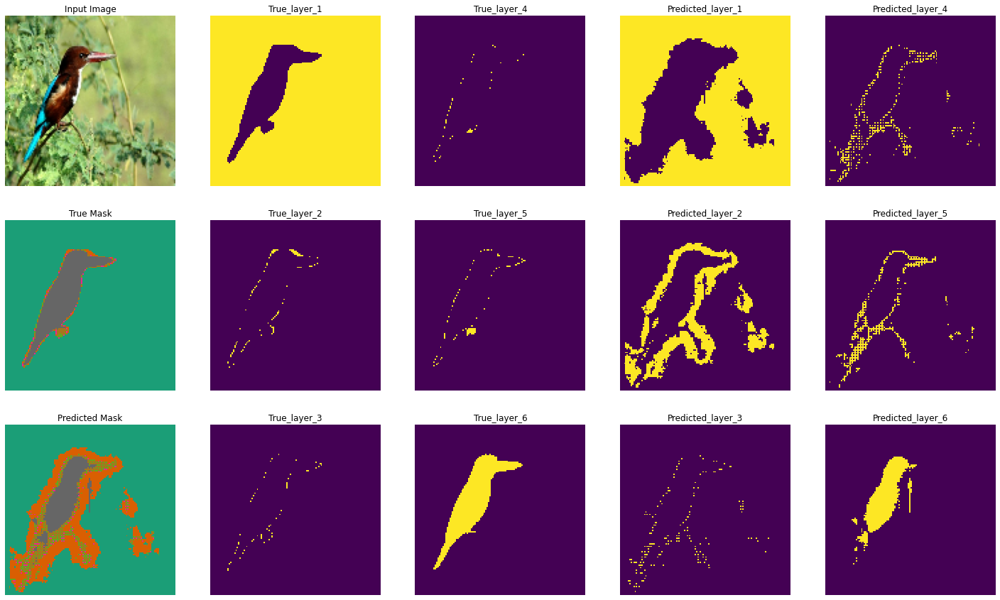

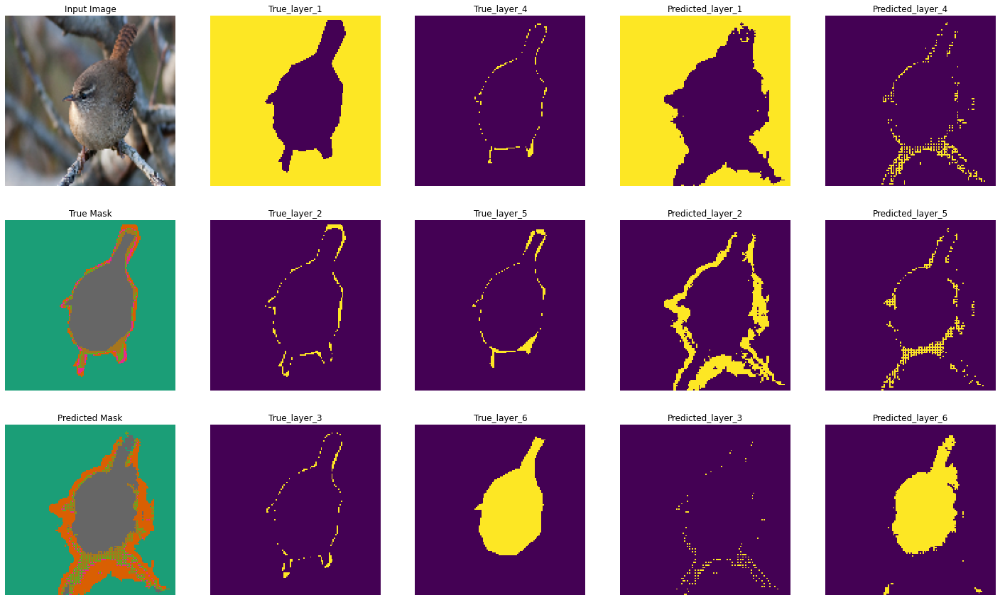

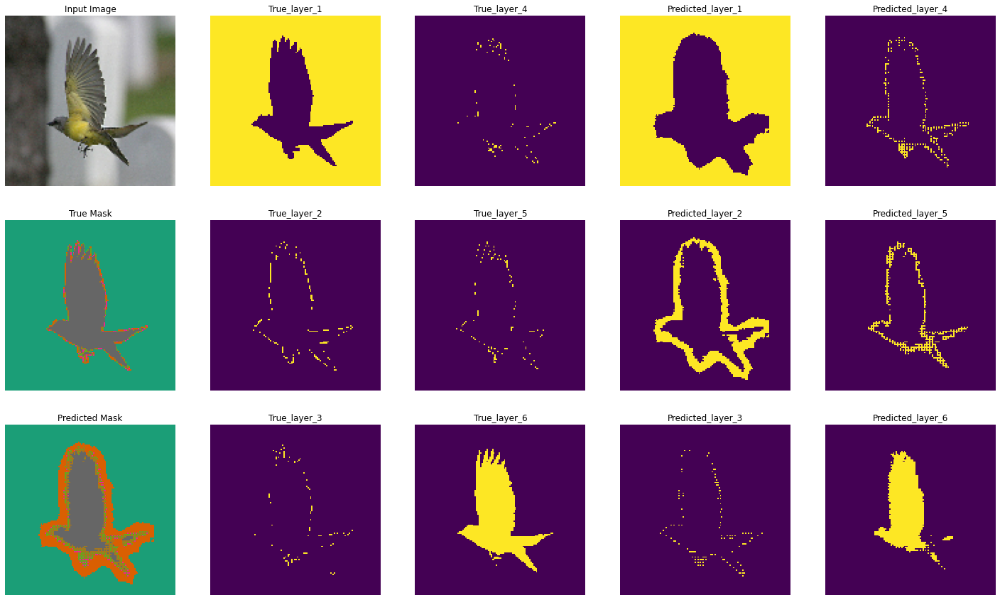

CPU times: user 3min 55s, sys: 12.4 s, total: 4min 7s
Wall time: 2min 18s


In [ ]:
%%time

score_new_train = nn(new_train_dataset, new_test_dataset, sample_image, sample_mask, num_test_examp, 
       STEPS_PER_EPOCH, OUTPUT_CHANNELS, NEW_BATCH_SIZE, down_stack_trainable=False, deep=5, 
        start_weights=False, auto_weights=True, epochs=EPOCHS, full=True, highlight=True,
          num_image=3)

In [ ]:
score_best, score_new_train

(0.5574451088905334, 0.5451447367668152)

Из-за того, что получалась слишком большая нагрузка на ОЗУ, пришлось уменьшить BATCH_SIZE вдвое. Видно, что из-за этого модель недообучается и показывает метрику хуже. Заметных различий в обучении моделей нету, можно скзать, что добавление отзеркаленных данных не помогло. К тому же нужно контролировать нагрузку на ОЗУ. Возможно это поможет, если обучать модель больше 100 эпох и увеличить BATCH_SIZE, но для этого нужно более лучшее ОЗУ.

### А теперь посмотрим как наша модель обучается по эпохам.

In [ ]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, model):
    display([sample_image[6,:,:,:], sample_mask[6,:,:,:], self.model.predict(sample_image)[6,:,:,:]], full=True, highlight=True)

Epoch 1/20
37/37 [==============================] - ETA: 0s - loss: 926645.3750 - score: 0.3202

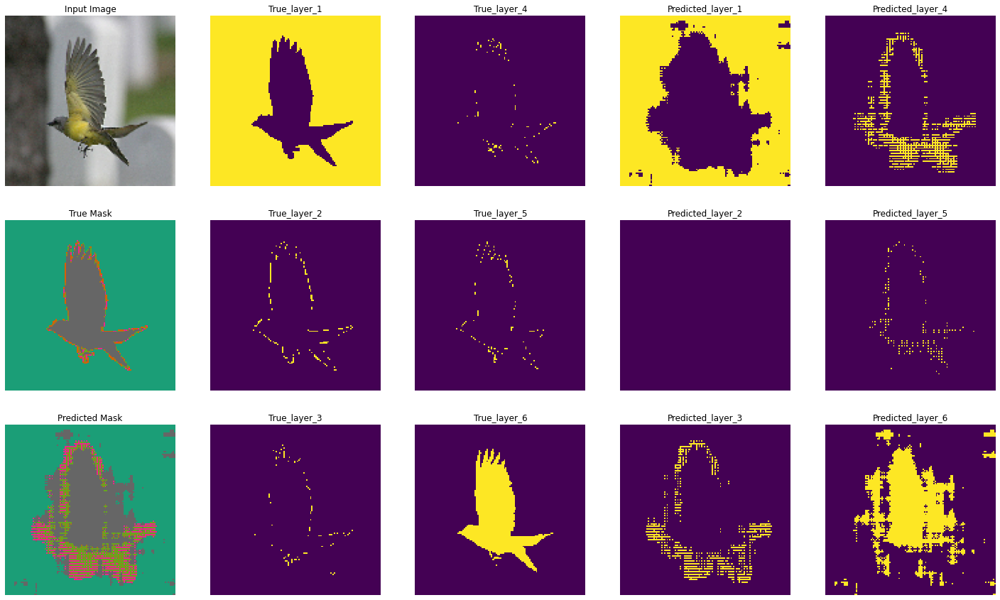

37/37 [==============================] - 13s 235ms/step - loss: 926645.3750 - score: 0.3202 - val_loss: 791695.3125 - val_score: 0.4188
Epoch 2/20
37/37 [==============================] - ETA: 0s - loss: 739529.0625 - score: 0.4596

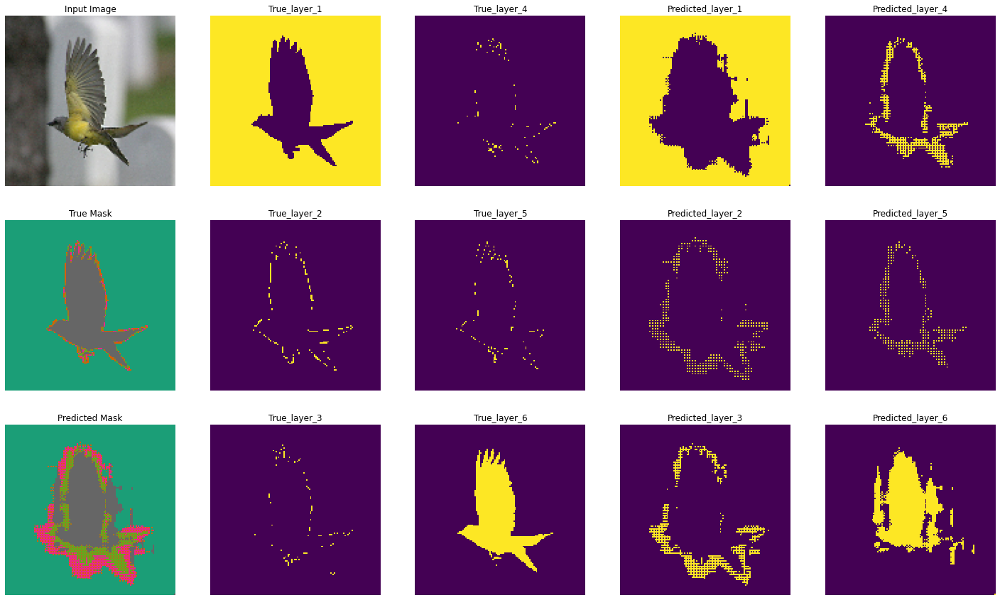

37/37 [==============================] - 7s 180ms/step - loss: 739529.0625 - score: 0.4596 - val_loss: 734260.1875 - val_score: 0.4610
Epoch 3/20
37/37 [==============================] - ETA: 0s - loss: 708577.8125 - score: 0.4789

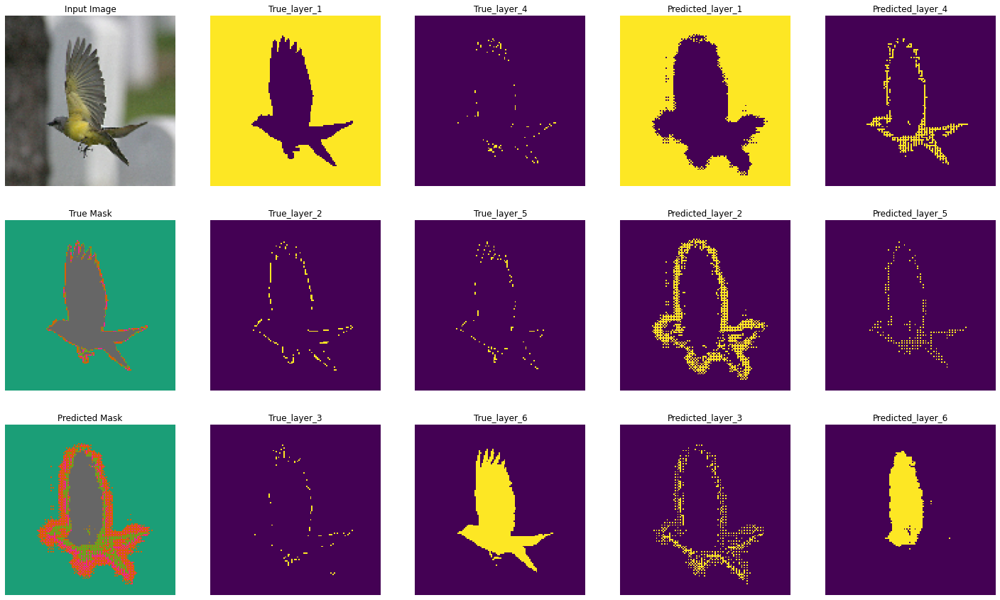

37/37 [==============================] - 6s 169ms/step - loss: 708577.8125 - score: 0.4789 - val_loss: 692995.5625 - val_score: 0.4913
Epoch 4/20
37/37 [==============================] - ETA: 0s - loss: 688663.3750 - score: 0.4974

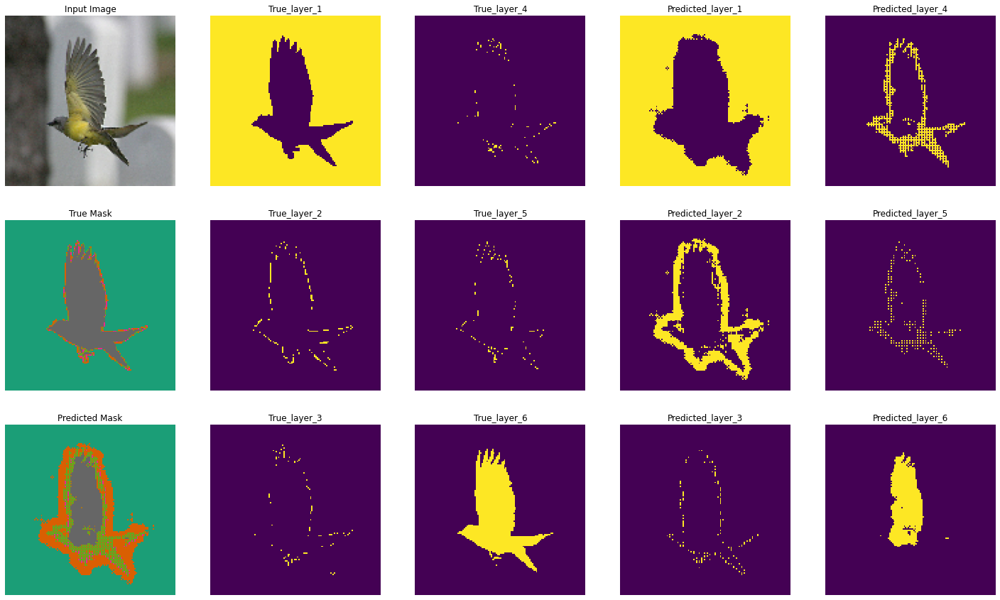

37/37 [==============================] - 10s 268ms/step - loss: 688663.3750 - score: 0.4974 - val_loss: 684566.3750 - val_score: 0.4975
Epoch 5/20
37/37 [==============================] - ETA: 0s - loss: 666896.5625 - score: 0.5125

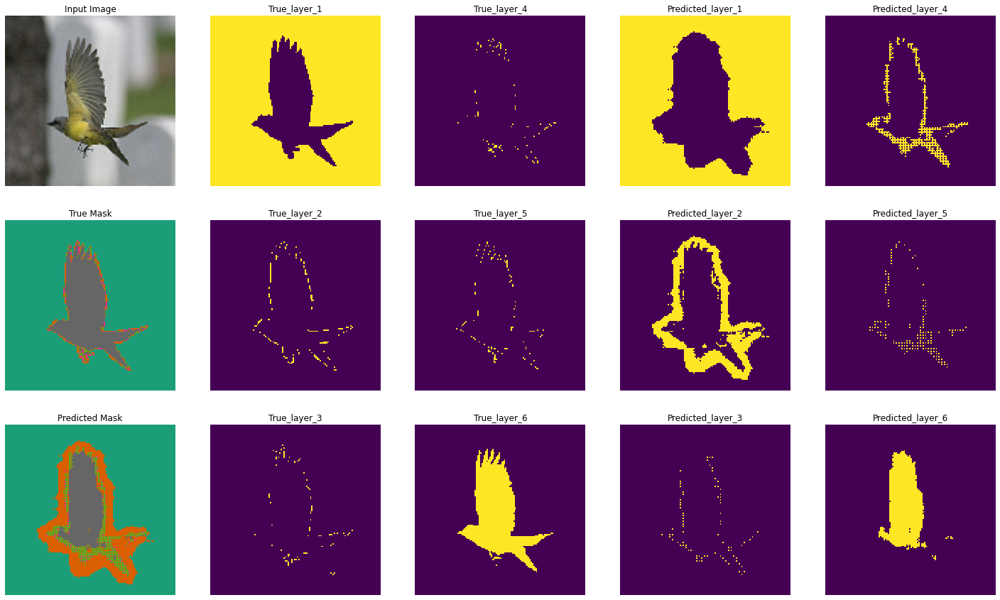

37/37 [==============================] - 7s 180ms/step - loss: 666896.5625 - score: 0.5125 - val_loss: 658096.3125 - val_score: 0.5169
Epoch 6/20
37/37 [==============================] - ETA: 0s - loss: 655139.3750 - score: 0.5205

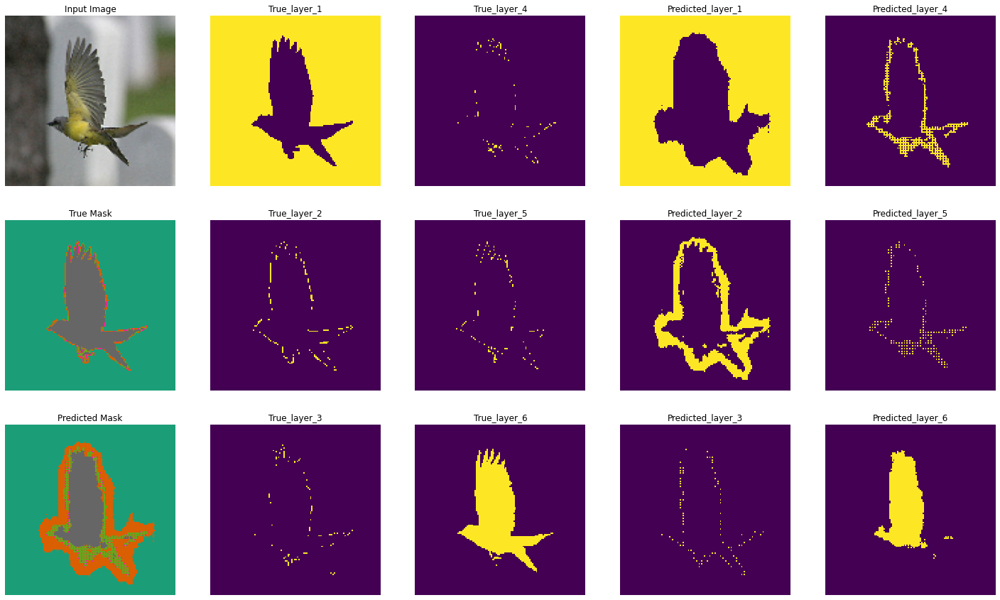

37/37 [==============================] - 6s 173ms/step - loss: 655139.3750 - score: 0.5205 - val_loss: 650115.9375 - val_score: 0.5228
Epoch 7/20
37/37 [==============================] - ETA: 0s - loss: 648037.8750 - score: 0.5258

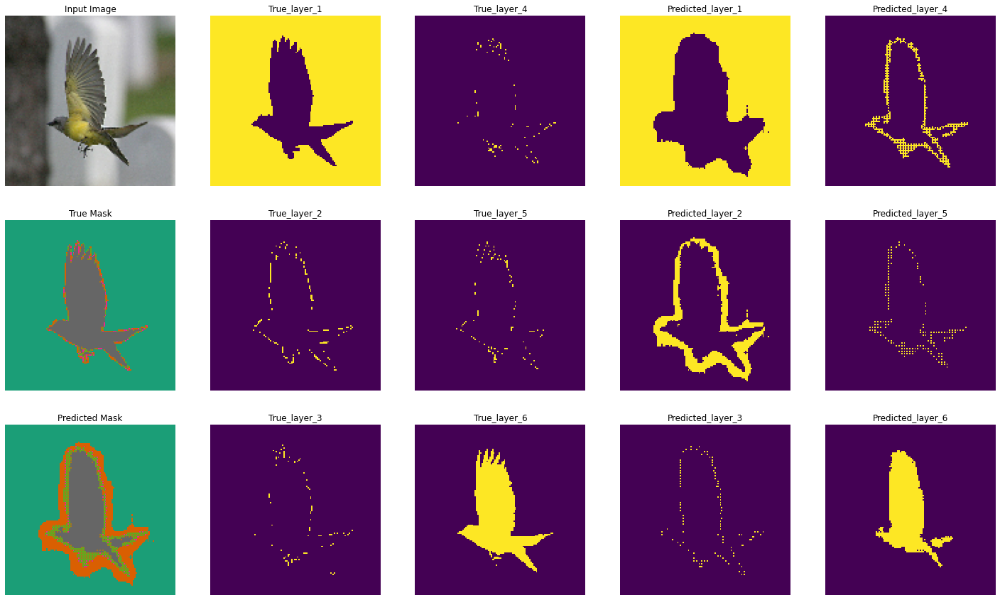

37/37 [==============================] - 6s 172ms/step - loss: 648037.8750 - score: 0.5258 - val_loss: 647197.4375 - val_score: 0.5249
Epoch 8/20
37/37 [==============================] - ETA: 0s - loss: 651213.1875 - score: 0.5208

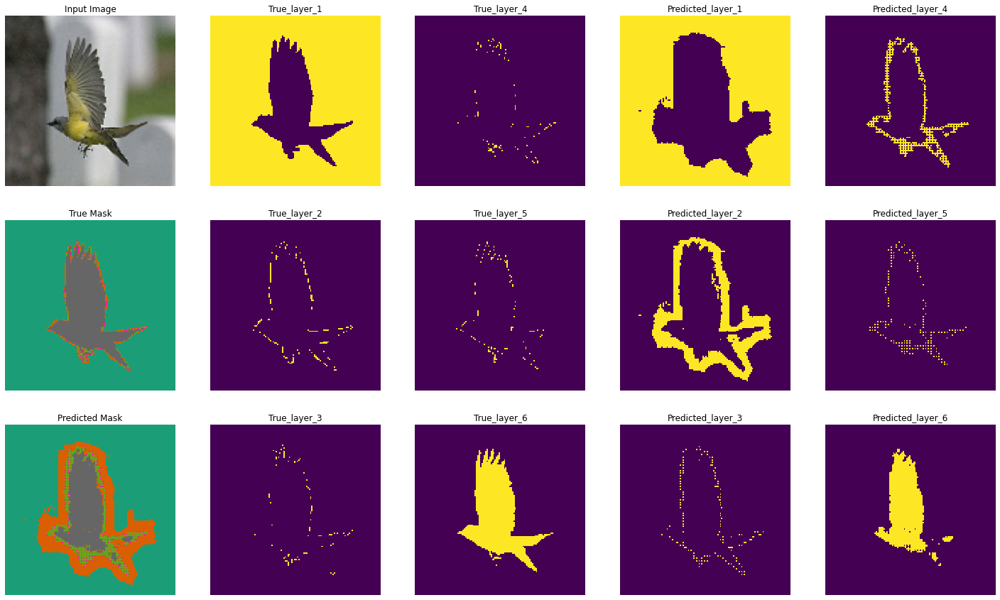

37/37 [==============================] - 6s 172ms/step - loss: 651213.1875 - score: 0.5208 - val_loss: 641626.1250 - val_score: 0.5290
Epoch 9/20
37/37 [==============================] - ETA: 0s - loss: 647095.6875 - score: 0.5250

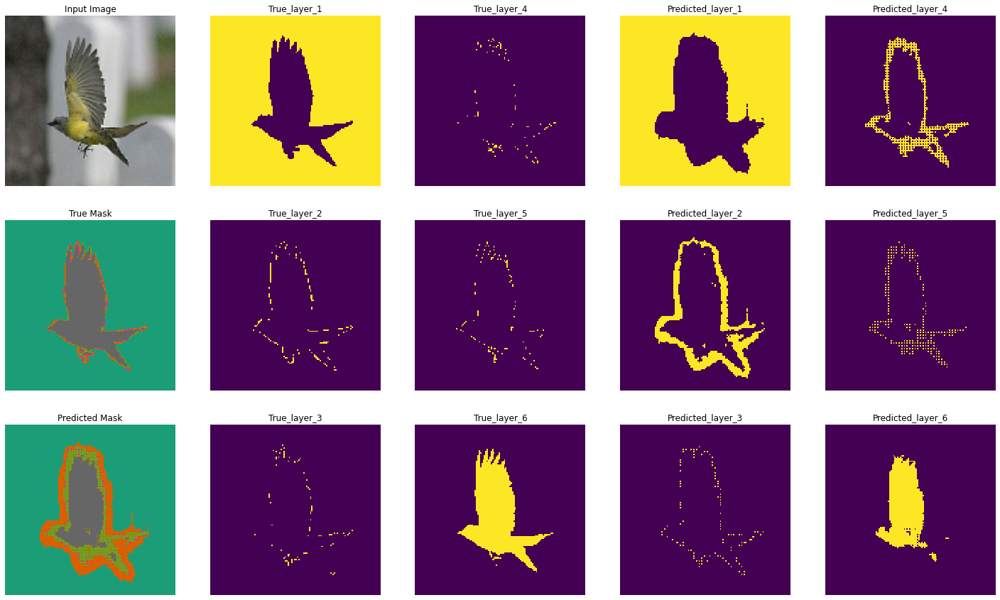

37/37 [==============================] - 6s 171ms/step - loss: 647095.6875 - score: 0.5250 - val_loss: 640091.3125 - val_score: 0.5301
Epoch 10/20
37/37 [==============================] - ETA: 0s - loss: 648656.3125 - score: 0.5267

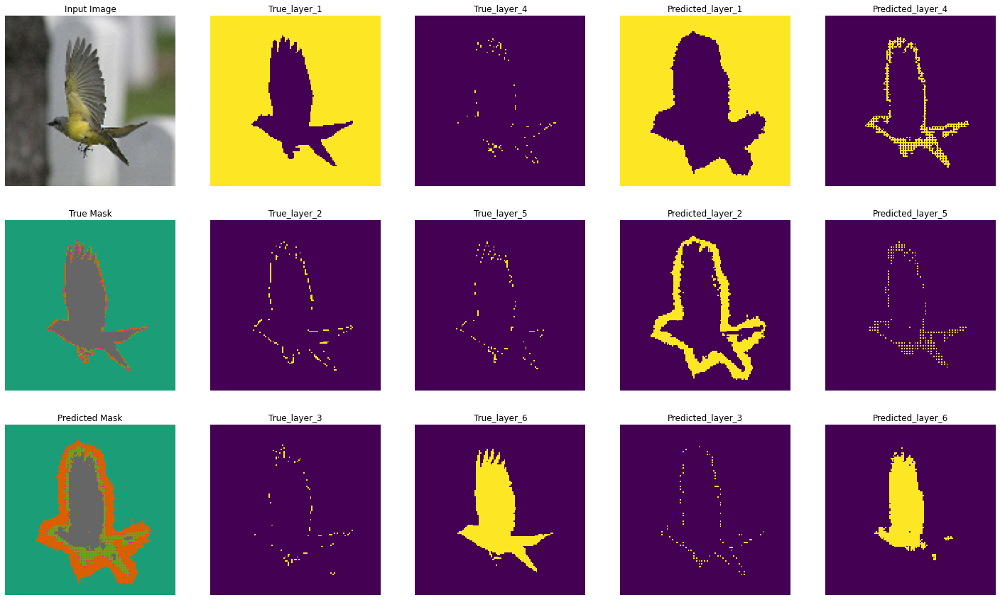

37/37 [==============================] - 7s 184ms/step - loss: 648656.3125 - score: 0.5267 - val_loss: 636606.3125 - val_score: 0.5327
Epoch 11/20
37/37 [==============================] - ETA: 0s - loss: 632244.4375 - score: 0.5327

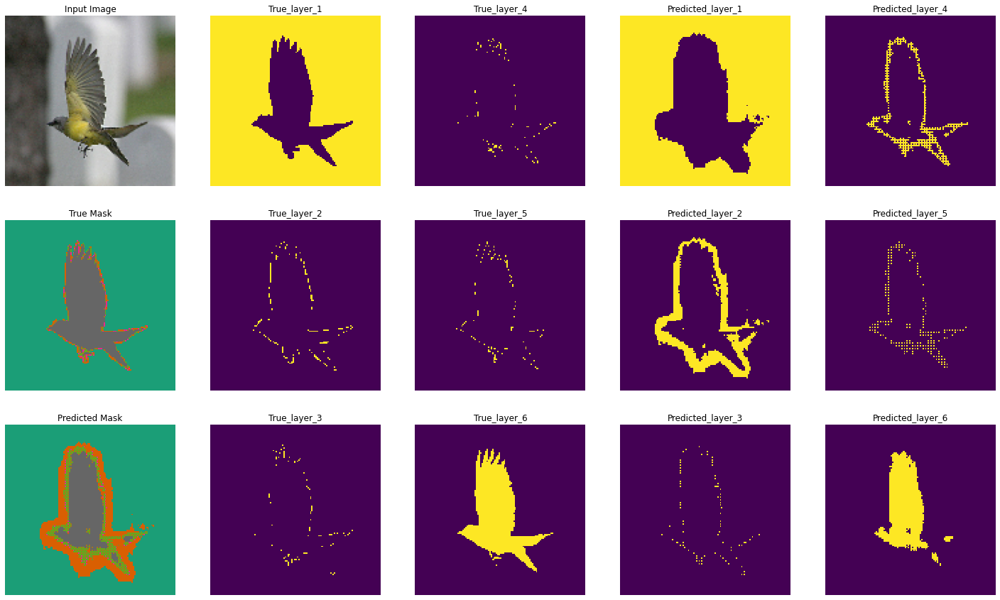

37/37 [==============================] - 6s 171ms/step - loss: 632244.4375 - score: 0.5327 - val_loss: 633124.3125 - val_score: 0.5352
Epoch 12/20
37/37 [==============================] - ETA: 0s - loss: 638630.8125 - score: 0.5333

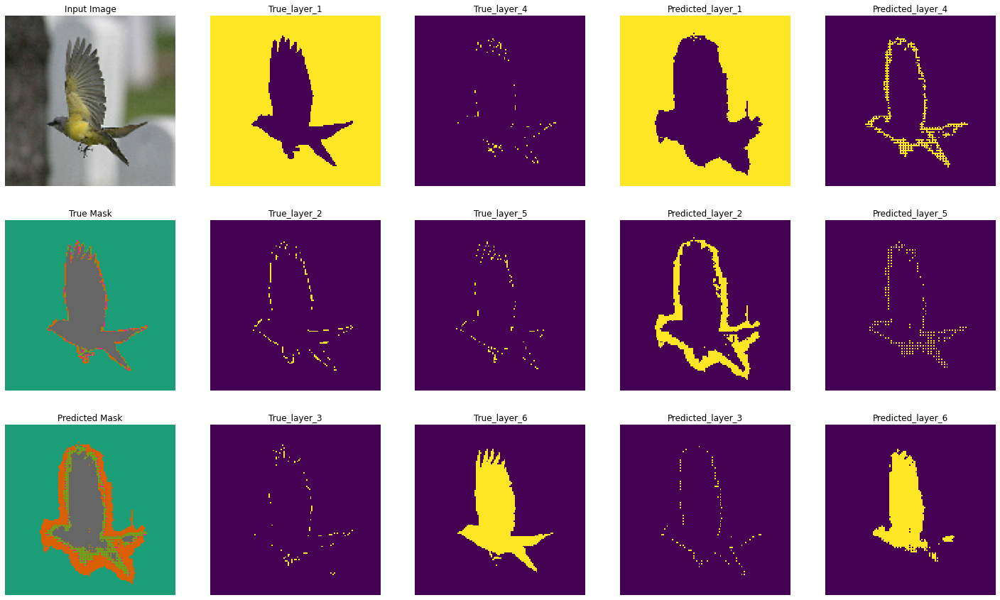

37/37 [==============================] - 6s 171ms/step - loss: 638630.8125 - score: 0.5333 - val_loss: 631452.0625 - val_score: 0.5365
Epoch 13/20
37/37 [==============================] - ETA: 0s - loss: 630404.8750 - score: 0.5367

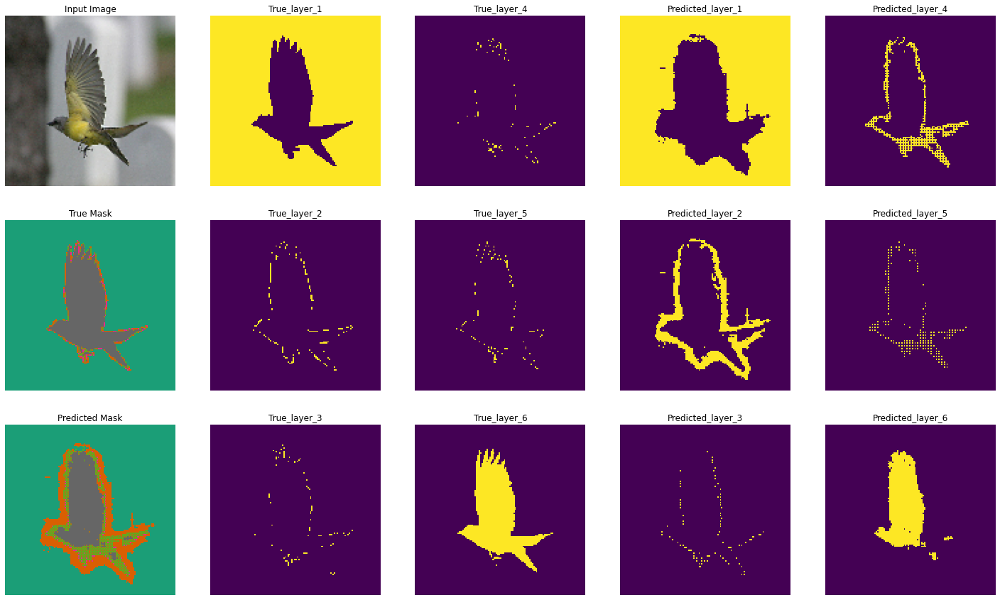

37/37 [==============================] - 6s 172ms/step - loss: 630404.8750 - score: 0.5367 - val_loss: 629212.4375 - val_score: 0.5381
Epoch 14/20
37/37 [==============================] - ETA: 0s - loss: 636119.8750 - score: 0.5360

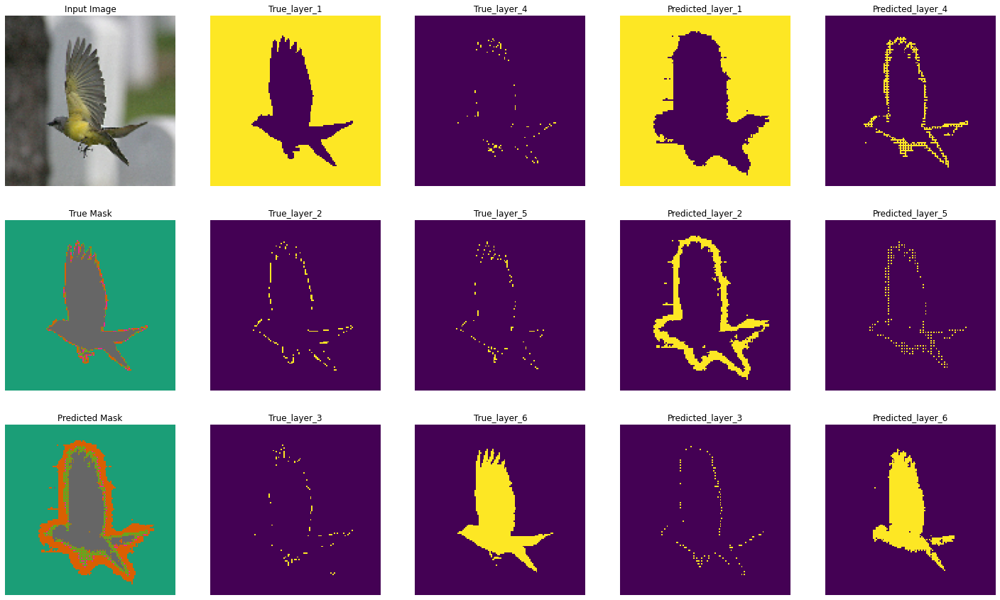

37/37 [==============================] - 7s 179ms/step - loss: 636119.8750 - score: 0.5360 - val_loss: 627756.8750 - val_score: 0.5392
Epoch 15/20
37/37 [==============================] - ETA: 0s - loss: 628077.6250 - score: 0.5407

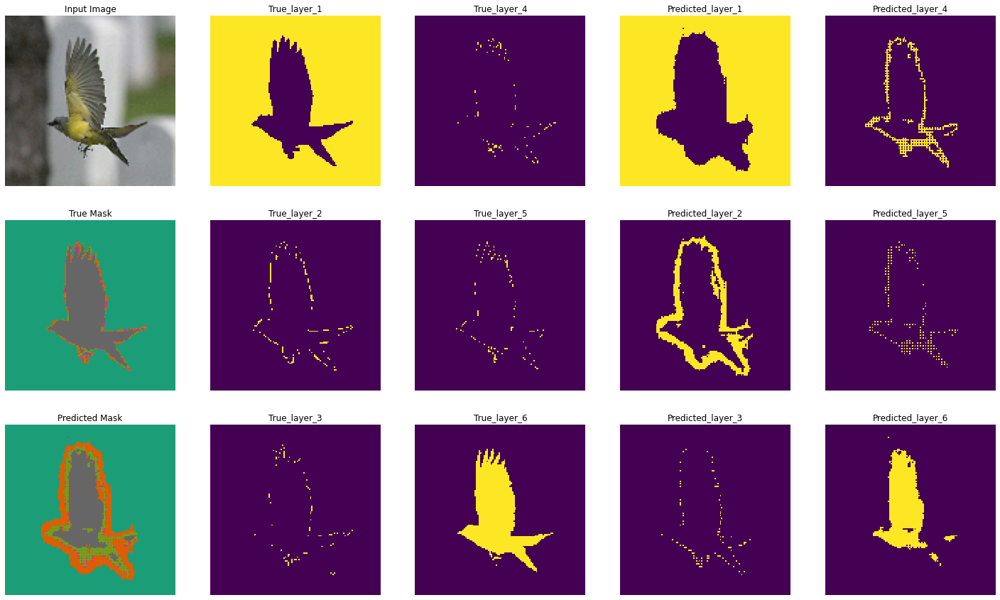

37/37 [==============================] - 6s 170ms/step - loss: 628077.6250 - score: 0.5407 - val_loss: 633947.8125 - val_score: 0.5346
Epoch 16/20
37/37 [==============================] - ETA: 0s - loss: 617715.8750 - score: 0.5482

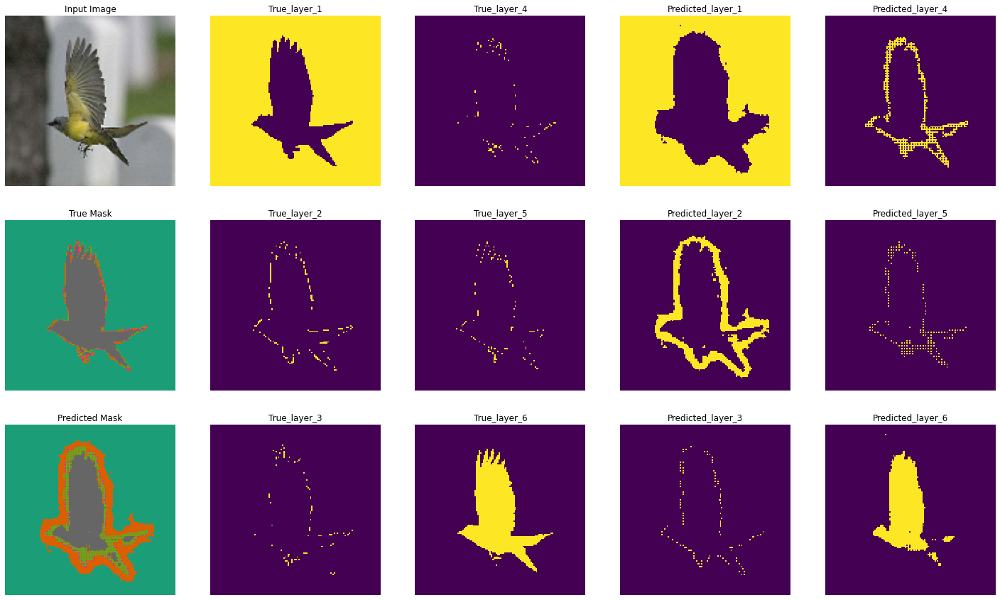

37/37 [==============================] - 6s 176ms/step - loss: 617715.8750 - score: 0.5482 - val_loss: 623408.8750 - val_score: 0.5424
Epoch 17/20
37/37 [==============================] - ETA: 0s - loss: 621247.8125 - score: 0.5453

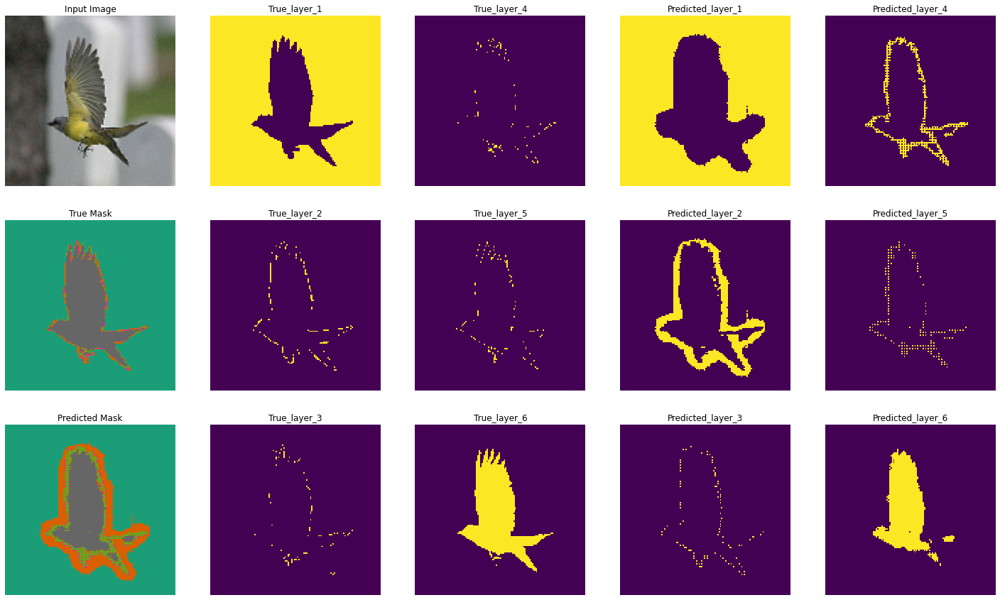

37/37 [==============================] - 6s 173ms/step - loss: 621247.8125 - score: 0.5453 - val_loss: 619942.8750 - val_score: 0.5449
Epoch 18/20
37/37 [==============================] - ETA: 0s - loss: 622178.6250 - score: 0.5424

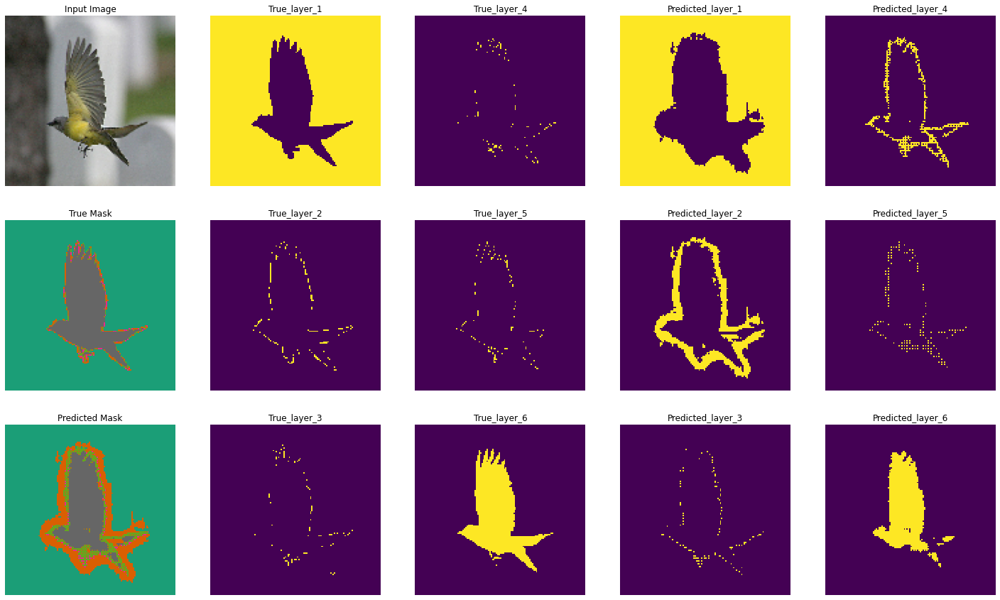

37/37 [==============================] - 7s 183ms/step - loss: 622178.6250 - score: 0.5424 - val_loss: 622561.0000 - val_score: 0.5430
Epoch 19/20
37/37 [==============================] - ETA: 0s - loss: 623807.4375 - score: 0.5436

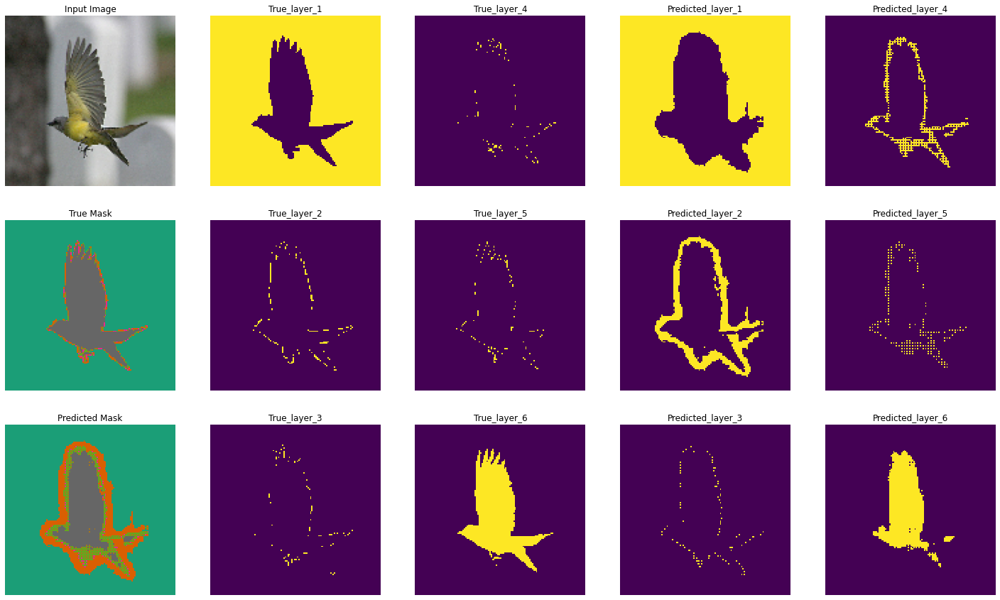

37/37 [==============================] - 6s 175ms/step - loss: 623807.4375 - score: 0.5436 - val_loss: 622944.8125 - val_score: 0.5427
Epoch 20/20
37/37 [==============================] - ETA: 0s - loss: 623709.3125 - score: 0.5428

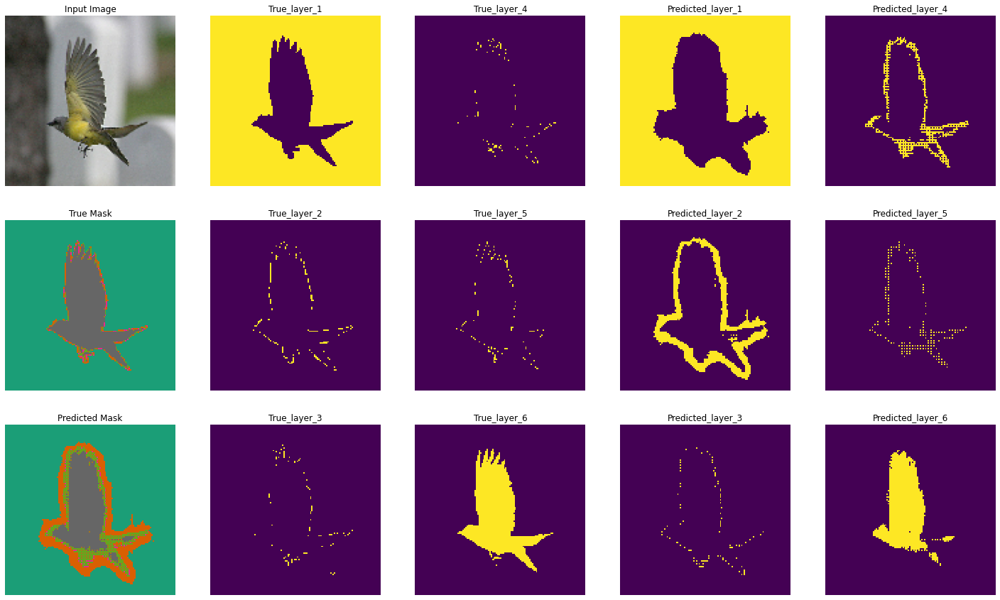

37/37 [==============================] - 7s 177ms/step - loss: 623709.3125 - score: 0.5428 - val_loss: 623871.0000 - val_score: 0.5420
CPU times: user 2min 16s, sys: 8.04 s, total: 2min 24s
Wall time: 2min 26s


In [ ]:
%%time

score_best = nn(train_dataset, test_dataset, sample_image, sample_mask, num_test_examp, 
       STEPS_PER_EPOCH, OUTPUT_CHANNELS, BATCH_SIZE, down_stack_trainable=False, deep=5, 
        start_weights=False, auto_weights=True, epochs=EPOCHS, full=True, highlight=True,
          num_image=0, callbacks=[DisplayCallback()])

Самые сильные изменения произошли за первые 10 эпох. Дальнейшие изменения не так заметны на данном примере изображения. 

### Вывод:

Я решил задачу сегментации изображения на наборе данных caltech_birds2011 для 6 несбалансированных классов с помощью нейронной сети u-net и написанных мною metric - score, loss - weighted_categorical_crossentropy, взяв уже обученный энкодер из MobileNetV2 и не обучав его в дальнейшем. Я проэксперементировал с выведенноми мною гиперпараметрами нейронной сети и описал каждый эксперимент. 